# MACHINE LEARNING MODELS EXECUTION STEPS

## (1) Project Definition

The first step in the machine learning workflow is to clearly define the objectives of the project. A clear definition here will allow proper data and model selection that would answer the questions being asked. This study would concentrate on predicting the production of sand from a well's profile in Fula Oilfield-Sudan. Two models would be built: an ordinary one that uses Vp, Vs, and 𝜌b as inputs, and another one that takes into account the mechanical causes of sand production and the simplification and generalizability issues related to the empirical formulas of sand prediction. The formula to be used as a base on which ML algorithms will optimize the results is:  Schlumberger sand production index (R). The mechanical properties to be included are: the elastic properties (Poisson's ratio, bulk, shear, and Young's modulus), formation strengths (tensile, shear, compressive), rock failure mechanisms (cohesion, friction angle), in-situ stresses (horizontal, vertical, overburden), porosity, and of course shear, compressional, and 𝜌b logging data. Preprocessing of data, such as exploratory data analysis and data QC and repair, would be done as this step enhances the model's performance. Because the data to be used is from a single well, the ensemble learning advanced algorithms such as LightGBM and support vector machine will be convenient for this task and would perform efficiently with expected high accuracy and reliability. For more optimization, hyperparameter tuning, cross-validation, and models' assessment would be carried out, resulting in an efficient model for optimizing the prediction of sanding in the producing wells located in the same block of the training well and overcoming the limitations of the empirical formulas by correcting errors made by these formulas, as ML models have the ability to catch complex patterns among variables and accordingly correct the output feature itself. And finally, this model would be compared with the ordinary one that does not consider the mechanical aspects of the formation and just uses Vp, Vs, and 𝜌b as inputs. Well B from Fula oilfield would be used as a case study to deploy and monitor the performance of the best models.

## (2) Data Collection

Well logging data from Fula North East for training would be used in this study, and it would be representative of Fula oilfield block 6. The other mechanical parameters and sand production profile would be estimated using the empirical formulas available and MS Excel, and then would be incorporated with the other necessary logging data. A well from Fula oilfield would be used to validate the models.

## (3) Exploratory Data Analysis

Here the data is being explored and analyzed deeply and carefully through multiple data visualizations to understand the quality of the data and its contents. This involves creating cross-plots of the logging curves to identify relationships between variables, initial identification of poor-quality data, understanding data contents and their ranges, etc.

In [1]:
# The first step is to import the necessary libraries
import numpy as np
import pandas as pd
import lasio
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns
import missingno as missno
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from yellowbrick.model_selection import LearningCurve, ValidationCurve, CVScores
from sklearn.model_selection import KFold
from sklearn.experimental import enable_halving_search_cv  
from sklearn.model_selection import HalvingGridSearchCV
import lightgbm as lgb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import matplotlib.patches as mpatches
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Here the file contaning the logging data will be loaded 
wella = lasio.read("Main_FNE-10_Pex Combined Log_5-Dec-2007_022PUP.las")

In [3]:
# Exploring the  file sections to select the required ones
wella.sections.keys()

dict_keys(['Version', 'Well', 'Curves', 'Parameter', 'Other'])

In [4]:
# gaining some Info about the well 
for item in wella.sections['Well']:
    print(f"{item.descr} ({item.mnemonic}): \t\t {item.value}")

START DEPTH (STRT): 		 30.48
STOP DEPTH (STOP): 		 974.7504
STEP (STEP): 		 0.1524
NULL VALUE (NULL): 		 -999.25
COMPANY (COMP): 		 PetroEnergy E&P Sudan Ltd.
WELL (WELL): 		 Fula NorthEast-10
FIELD (FLD): 		 Fula
LOCATION (LOC): 		 Block 6
COUNTY (CNTY): 		 GW-43
STATE (STAT): 		 Sudan
COUNTRY (CTRY): 		 Sudan
API NUMBER (API): 		 
UNIQUE WELL ID (UWI): 		 
LOG DATE {DD-MMM-YYYY} (DATE): 		 05-Dec-2007
SERVICE COMPANY (SRVC): 		 Schlumberger
LATITUDE (LATI): 		 11 21' 45.60 N
LONGITUDE (LONG): 		 28 31' 19.84" E
GeoDetic Datum (GDAT): 		 


In [5]:
# Exploring the curves and the units of the well
for count, curve in enumerate(wella.curves):
    print(f"curve: {curve.mnemonic}, \t Units: {curve.unit}, \t Description: {curve.descr}")
print(f"there are total of: {count+1} curves present within this file")

curve: DEPT, 	 Units: M, 	 Description: DEPTH (BOREHOLE) {F10.4}
curve: BS, 	 Units: IN, 	 Description: Bit Size {F13.4}
curve: CS, 	 Units: F/HR, 	 Description: Cable Speed {F13.4}
curve: DT1, 	 Units: US/F, 	 Description: Delta-T Shear - Lower Dipole {F13.4}
curve: DT2, 	 Units: US/F, 	 Description: Delta-T Shear - Upper Dipole {F13.4}
curve: DT4P, 	 Units: US/F, 	 Description: Delta-T Compressional - Monopole P&S {F13.4}
curve: DT4S, 	 Units: US/F, 	 Description: Delta-T Shear - Monopole P&S {F13.4}
curve: DTCO, 	 Units: US/F, 	 Description: Delta-T Compressional {F13.4}
curve: DTSM, 	 Units: US/F, 	 Description: Delta-T Shear {F13.4}
curve: DTST, 	 Units: US/F, 	 Description: Delta-T Stoneley - Monopole Stoneley {F13.4}
curve: GR, 	 Units: GAPI, 	 Description: Gamma-Ray {F13.4}
curve: HCAL, 	 Units: IN, 	 Description: HRCC Cal. Caliper {F13.4}
curve: HDRA, 	 Units: G/C3, 	 Description: HRDD Density Correction {F13.4}
curve: ICV, 	 Units: M3, 	 Description: Integrated Cement Volume 

In [6]:
# The LAS file will be converted to pandas dataframe as this will make dealing with the data much more easier
WELLA = wella.df()

In [7]:
# Removing the unwanted columns and just keep the ones needed
unwanted_columns = ['TENS','SP','CS','DTST','DT4P','ICV','PEFZ'
                    ,'HDRA','IHV','RLA5','RLA3','DT4S','DT1','DTSM','RXOZ']
WELLA = WELLA.drop(unwanted_columns, axis=1) 

In [8]:
# At this step the necessary columns will be renamed with a more familiar letters 
WELLA = WELLA.rename(columns = {'DT2':'DTS', 'DTCO':'DTC', 'HCAL':'CAL'
                                ,'RHOZ': r'$\rho$'+'b','BS':'BIT'})

In [9]:
# Here the curves were reordered 
new_order = ['DTC','DTS', r'$\rho$'+'b', 'GR', 'CAL', 'BIT']
WELLA = WELLA[new_order]

In [10]:
# Showing the statistical information about each variable curve
WELLA.describe()

,DTC,DTS,$\rho$b,GR,CAL,BIT
count,6197.000000,6197.000000,6187.000000,6197.000000,6197.000000,6197.00
mean,128.454404,320.533596,0.035259,82.279865,13.013994,12.25
std,22.625150,105.133523,166.171526,22.568857,2.914112,0.00
min,50.011700,153.191800,-13068.455500,38.405400,10.208100,12.25
25%,111.637200,236.250700,2.040200,64.103100,12.084300,12.25
50%,129.999000,298.243500,2.126700,80.671000,12.303900,12.25
75%,144.790400,394.346500,2.204900,97.631600,12.523500,12.25
max,192.771200,742.606100,4.628800,231.629800,24.497600,12.25


In [11]:
# Data type identification
print(WELLA.dtypes)

DTC        float64
DTS        float64
$\rho$b    float64
GR         float64
CAL        float64
BIT        float64
dtype: object


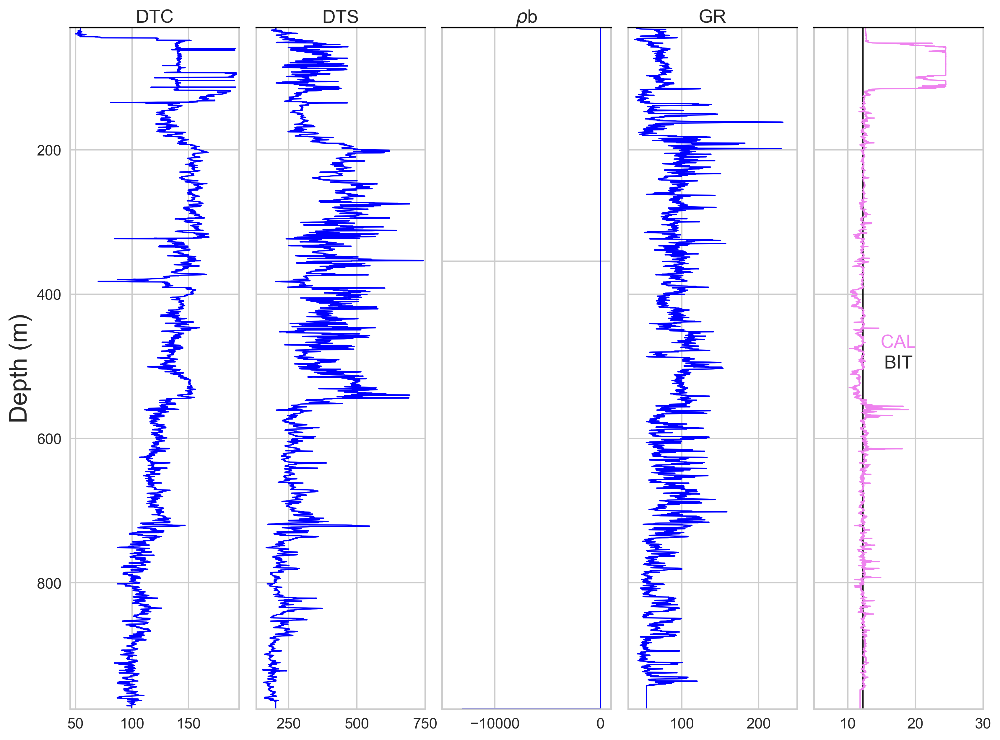

In [12]:
# Plotting the logging data
WELLA.reset_index(inplace=True)

fig, axes = plt.subplots(figsize=(16,10), dpi=300)
curve_names = ['DTC', 'DTS', r'$\rho$'+'b', 'GR', 'CAL', 'BIT']
 
# Setup the plot axes and the individual log tracks / subplots
ax1 = plt.subplot2grid((1,6),(0,0), rowspan=1, colspan = 1) 
ax1.plot("DTC", "DEPT", data = WELLA, color = "blue", lw=1)
ax1.set_xlim(45, 195)
ax1.set_ylabel('Depth (m)', fontsize=20)

ax2 = plt.subplot2grid((1,6),(0,1), rowspan=1, colspan = 1) 
ax2.plot("DTS", "DEPT", data = WELLA, color = "blue", lw=1)
ax2.set_xlim(130, 750)

ax3 = plt.subplot2grid((1,6),(0,2), rowspan=1, colspan = 1) 
ax3.plot(r'$\rho$'+'b', "DEPT", data = WELLA, color = "blue", lw=1)
ax3.set_xlim(-15000, 1000)
ax3.semilogy()

ax4 = plt.subplot2grid((1,6),(0,3), rowspan=1, colspan = 1)
ax4.plot("GR", "DEPT", data = WELLA, color = "blue", lw=1)
ax4.set_xlim(30, 250)

# Adjust the layout to remove space before the last curve
ax5 = plt.subplot2grid((1,6),(0,4), rowspan=1, colspan=1) 
ax5.plot("BIT", "DEPT", data=WELLA, color="black", lw=1)
ax5.set_xlim(5, 30)
ax5.spines['top'].set_visible(False)
ax5.set_xlabel("BIT", fontsize=15, color="violet")
ax5.xaxis.set_label_coords(4, 0.53)  # Adjust the coordinates for right placement
ax5.tick_params(axis='x', labeltop=False)  # Hide tick labels above the last curve

ax6 = ax5.twiny()
ax6.plot("CAL", "DEPT", data=WELLA, color="violet", lw=1)
ax6.set_xlim(5, 30)
ax6.set_xlabel("CAL", fontsize=15)
ax6.xaxis.set_label_coords(4, 0.5)  # Adjust the coordinates for right placement
ax6.tick_params(axis='x', labeltop=False)  # Hide tick labels above the last curve

# Setup the common elements between the subplots
for i, ax in enumerate(fig.axes):
    ax.set_ylim(974.7504, 30.48) # Set the depth range
    ax.locator_params(axis='x', nbins=2)
    ax.tick_params(labelsize=12)
    ax.set_xlabel(curve_names[i])
    
    ax.xaxis.set_label_position("top")
    ax.spines['top'].set_edgecolor('black')
    ax.set_xlabel(curve_names[i], fontsize=15)
    
# Hide tick labels on y-axis    
for ax in [ax2, ax3, ax4, ax5, ax6]:
    plt.setp(ax.get_yticklabels(), visible = False)
    
# Reducing the space between each subplot
fig.subplots_adjust(wspace=0.1)
# showing the plots
plt.show();

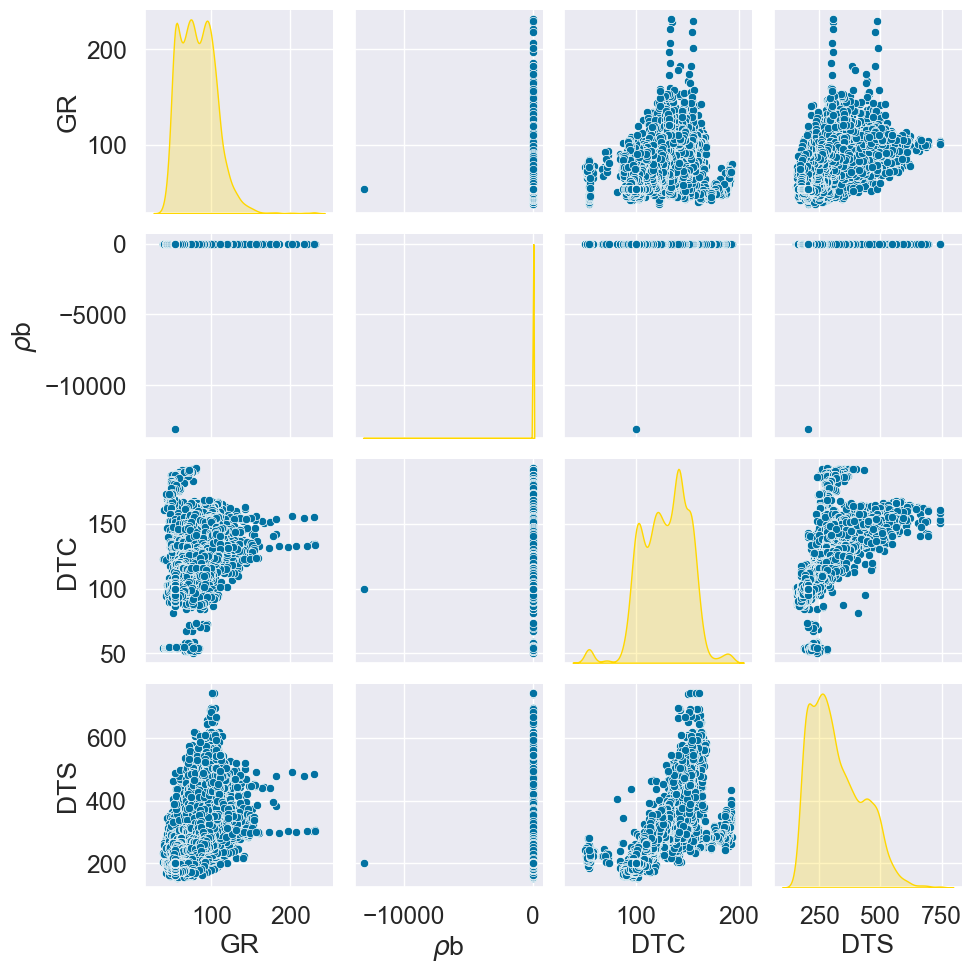

In [13]:
# At this step a pairplot of the input features is displayed
# Set style and context for the plot
sns.set_style('darkgrid')
sns.set_context("notebook", font_scale=1.6)

# Select the inputs to be plotted
inputs = ['GR', r'$\rho$'+'b', 'DTC', 'DTS']

# Create pair plot with only the lower triangle of plots
sns.pairplot(WELLA[inputs], diag_kind='kde', diag_kws={'color':'gold'})

## (4) Data QC & Repair

This is the most important step, and it takes up the bulk of the project time. Here the data is prepared to fit for modeling. In this stage, the quality of the data is assessed through visualizations to identify missing values and outliers and decide how to deal with them to achieve the desired results of the whole project.

<AxesSubplot:>

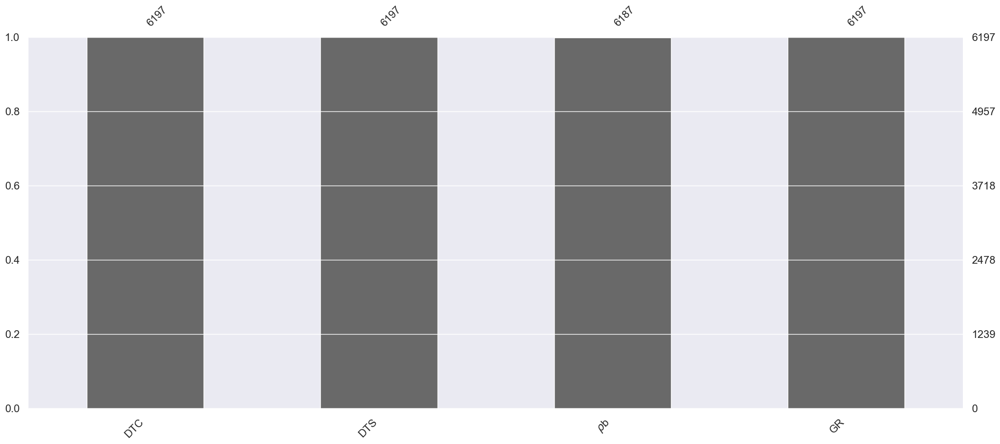

In [14]:
# The first step is to identify missing values across the needed columns usning the next bar
missno.bar(WELLA[['DTC', 'DTS', r'$\rho$'+'b', 'GR']])

In [15]:
# Identify missing values through statistics
WELLA[['DTC', 'DTS', r'$\rho$'+'b', 'GR']].isnull().sum()

DTC         0
DTS         0
$\rho$b    10
GR          0
dtype: int64

In [16]:
# At this step the rows with missing values would be displayed
WELLA[WELLA.isnull().any(axis=1)][['DTC', 'DTS', r'$\rho$'+'b', 'GR']]  

,DTC,DTS,$\rho$b,GR
6187,99.722,202.0296,NaN,53.9784
6188,99.722,202.0296,NaN,53.9784
6189,99.722,202.0296,NaN,53.9784
6190,99.722,202.0296,NaN,53.9784
6191,99.722,202.0296,NaN,53.9784
6192,99.722,202.0296,NaN,53.9784
6193,99.722,202.0296,NaN,53.9784
6194,99.722,202.0296,NaN,53.9784
6195,99.722,202.0296,NaN,53.9784
6196,99.722,202.0296,NaN,53.9784


In [17]:
# Here the missing values percentage of the whole data is presented
missing_percentage = WELLA[['DTC', 'DTS', r'$\rho$'+'b', 'GR']].isnull().mean() * 100
print(missing_percentage)

DTC        0.000000
DTS        0.000000
$\rho$b    0.161368
GR         0.000000
dtype: float64


Deleting the missing values is a widely used and practical technique that has taken on the status of many software packages' default mechanism for addressing missing data (Kang, 2013; van Buuren, 2018). When there are one or more missing values, this procedure eliminates all rows (cases). Each instance of missing values in a single variable is eliminated along with the values that correspond in the other variables. This is equivalent to removing a whole depth level in well logs. Since there are just 10 missing values, which represents 0.16% in the bulk density column, the appropriate approach is to just remove them, as they wouldn't affect models performance.

In [18]:
# Removing the missing values
WELLA.dropna(inplace=True)

In [19]:
# Check if the removal process is done correctly
WELLA[['DTC', 'DTS', r'$\rho$'+'b', 'GR']].isnull().sum()

DTC        0
DTS        0
$\rho$b    0
GR         0
dtype: int64

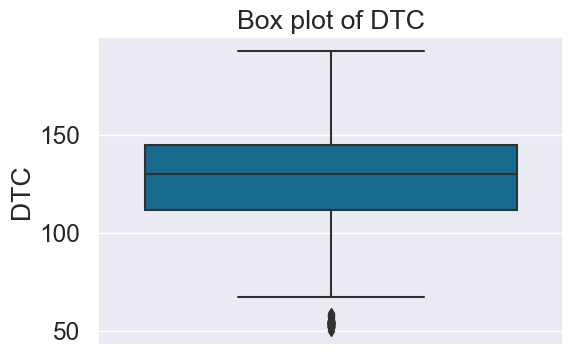

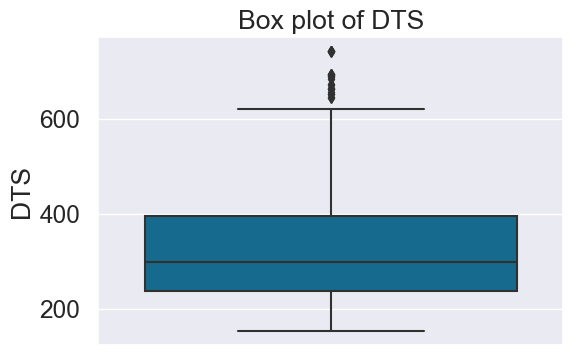

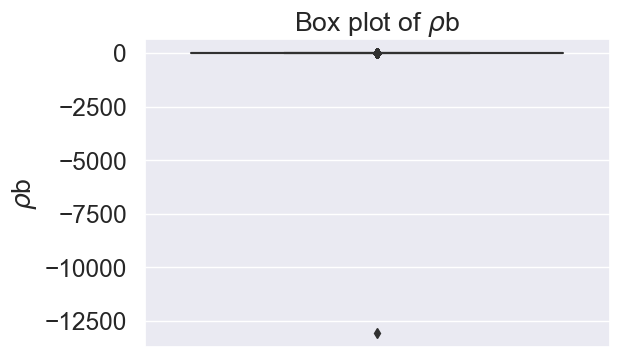

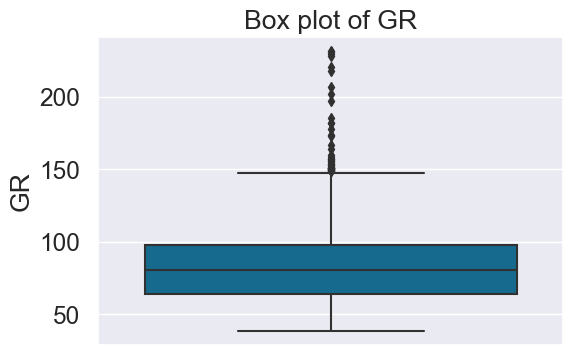

In [20]:
# Plotting Box Plots for primary outliers identification 
# Define the columns for plotting
columns = ['DTC', 'DTS', r'$\rho$'+'b', 'GR'] 

# Loop through each column and create a separate box plot
for col in columns:
    plt.figure(figsize=(6, 4)) 
    sns.boxplot(y=WELLA[col])
    plt.title(f'Box plot of {col}')
    plt.show()
    plt.close() 

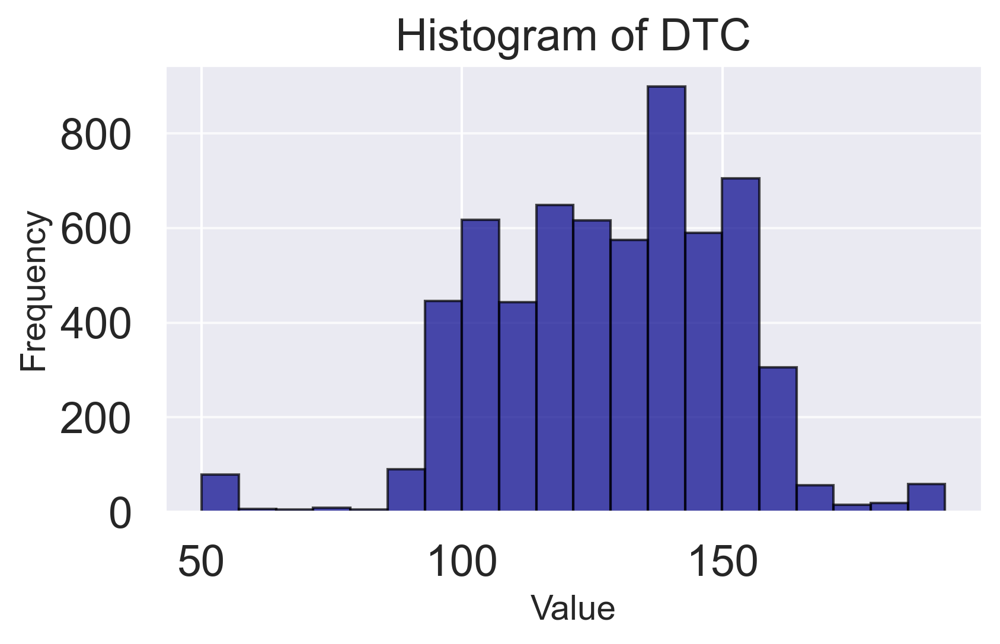

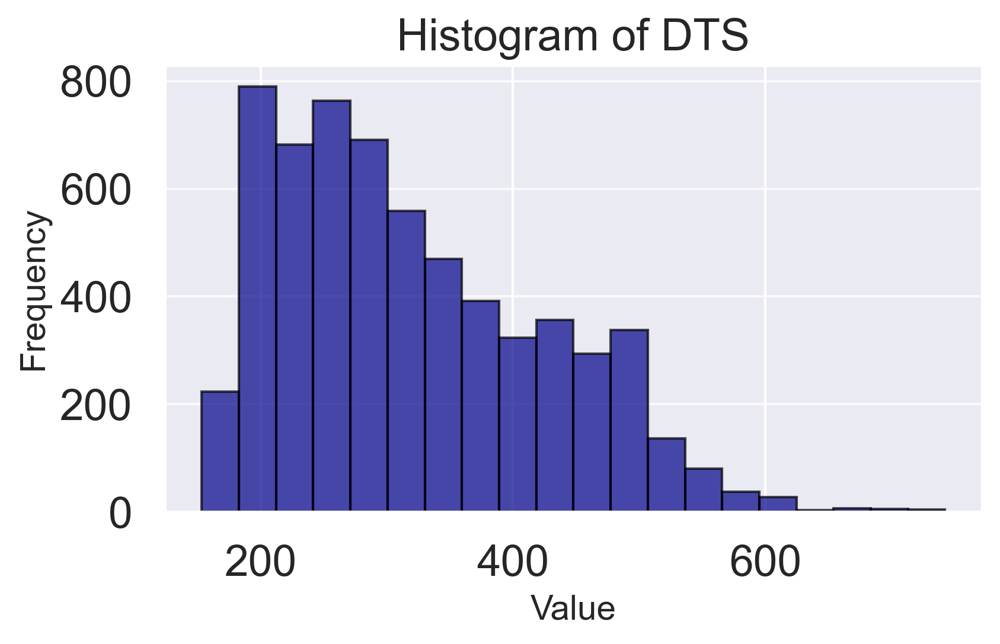

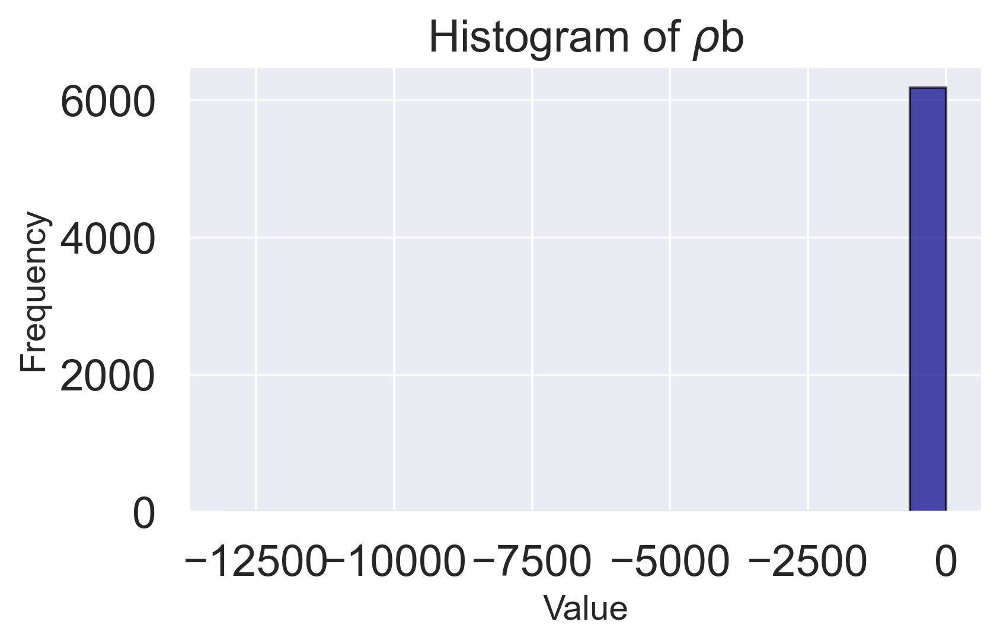

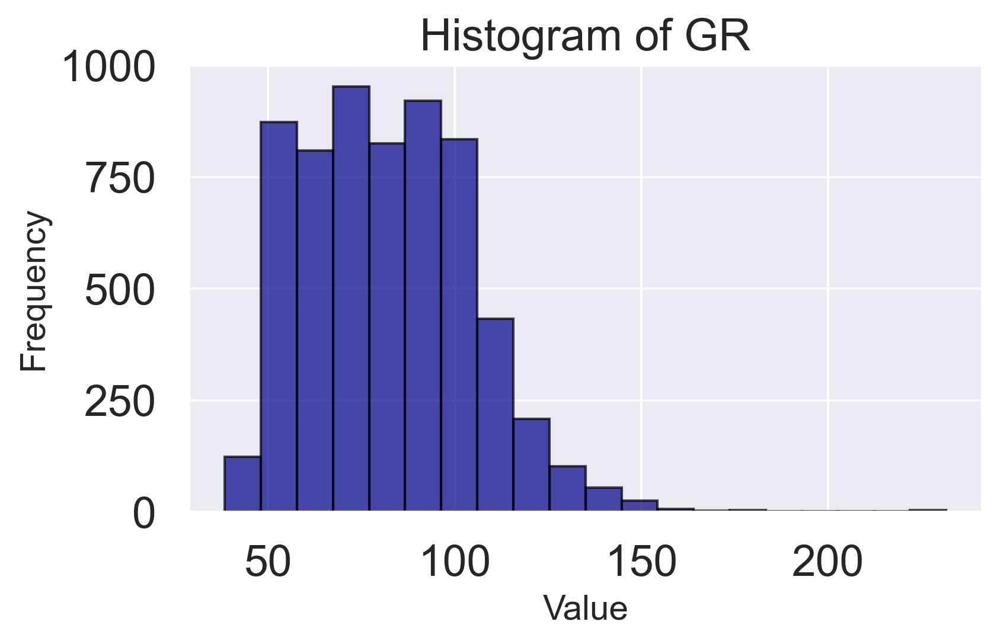

In [21]:
# ploting histogram for additional checking for outliers

variables = ['DTC', 'DTS', r'$\rho$'+'b', 'GR']  

for var in variables:
    plt.figure(figsize=(6, 4), dpi=300)  
    plt.hist(WELLA[var], bins=20, alpha=0.7, color='darkblue', edgecolor='black')  
    plt.title(f'Histogram of {var}', fontsize=18)  
    plt.xlabel('Value', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.grid(axis='y', alpha=0.75)  
    plt.tight_layout()

In [22]:
# Checking the data types
print(WELLA.dtypes)

DEPT       float64
DTC        float64
DTS        float64
$\rho$b    float64
GR         float64
CAL        float64
BIT        float64
dtype: object


In [23]:
# Now excluding the unneeded columns from outlier removal process
columns_to_exclude = ['CAL', 'BIT']
# Create a DataFrame excluding the specified columns for outlier detection
WELLA_outlier_removal = WELLA.drop(columns=columns_to_exclude, axis=1)

In [24]:
# For this study Isolation Forest method was selected to detect then removing outliers
# (1) Fit Isolation Forest model
iso_forest = IsolationForest(contamination=0.05, random_state=42)  
outliers = iso_forest.fit_predict(WELLA_outlier_removal)

# (2) Display number of datapoints before removal
print(f"Number of datapoints before removal: {len(WELLA_outlier_removal)}")

# (3) Remove outliers
WELLA_outlier_removal['outlier'] = outliers
WELLa_cleaned = WELLA_outlier_removal[WELLA_outlier_removal['outlier'] != -1]  # here -1 indicates outliers

# Drop the 'outlier' column after removal
WELLA_cleaned = WELLa_cleaned.drop(columns=['outlier'])

# (4) Display number of datapoints after removal
print(f"Number of datapoints after removal: {len(WELLa_cleaned)}")

Number of datapoints before removal: 6187
Number of datapoints after removal: 5877


In [25]:
# checking the data
WELLA_cleaned

,DEPT,DTC,DTS,$\rho$b,GR
125,49.5300,143.8728,324.5827,2.1098,56.6215
126,49.6824,142.3763,302.0849,1.9706,56.9457
127,49.8348,146.2674,313.7183,1.9479,60.2060
128,49.9872,144.0060,284.1090,1.9519,60.6937
129,50.1396,145.4355,282.7592,1.9460,59.7693
...,...,...,...,...,...
6182,972.6168,99.7220,202.0296,2.3576,53.9784
6183,972.7692,99.7220,202.0296,2.3571,53.9784
6184,972.9216,99.7220,202.0296,2.3511,53.9784
6185,973.0740,99.7220,202.0296,2.3454,53.9784


In [27]:
WELLA_cleaned.describe()

,DEPT,DTC,DTS,$\rho$b,GR
count,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000
mean,516.880405,128.900945,321.814175,-0.114936,82.656795
std,262.711580,19.708870,103.062748,170.497009,21.823275
min,49.530000,69.979600,153.191800,-13068.455500,40.026500
25%,291.998400,112.941400,237.807200,2.042200,64.577700
50%,517.702800,130.102600,300.815800,2.125500,81.434200
75%,743.254800,144.320200,398.316700,2.199300,97.930000
max,973.226400,191.221200,742.067900,2.542600,182.226400


In [28]:
# Checking the data type again
print(WELLA_cleaned.dtypes)

DEPT       float64
DTC        float64
DTS        float64
$\rho$b    float64
GR         float64
dtype: object


The presence of outliers within a dataset used for petrophysical analysis or within many machine learning models can skew and reduce the precision and accuracy of the results. Therefore, it is key that they are identified using a mixture of statistical tests and machine learning visualizations. The methods for dealing with outliers are similar to those for dealing with missing data values. The handling of outliers can be a controversial topic. Their removal can result in model improvement or it can lead to a loss of information. And as the data is large enough and the outliers are just 310 datapoints, then outliers can be removed or nullified to prevent any skewing of prediction results.

## (5) Mechanical Properties and Sand Production Profile Estimation

At this step, Microsoft 365 Excel is used to estimate the required geomechanical properties and sand production profile of well A, and the steps are as follows:

* The first step is to download a CSV file copy of the cleaned data to use it in the calculation of the required properties.
* The second step is to estimate the desired mechanical properties: the elastic modules, formation strengths, in situ stresses, rock failure criteria,  and porosity.

* The third step is to estimate the sand production prediction model: Schlumberger Sand Production Index (S/I).

* The final step is to save the file that contains all of these data and upload it back to Jupyter notebook to use it for modeling.

In [28]:
# Save the DataFrame as a CSV file
WELLA_cleaned.to_csv('cleaned_data.csv', index=False)

In [29]:
# Reading the file containing the necessary logging and mechanical properties data
C_WELLA = pd.read_csv('Cleaned_Data11.csv')

In [30]:
# At this step the some columns will be renamed with a more known letters 
C_WELLA = C_WELLA.rename(columns = {'Pb':r'$\rho$'+'b', 'Pisson Ratio':'μ', 'OV':'Pov', 'Biot Constant': 'α','Friction Angle':'θ','Os':'φ','Horizontal Stresses':'σ'+'H','Tensile Strength':'σ'+'t','Shear Strength':'τ', 'EC2':'Ec'})

In [31]:
# Showing the statistical information about each column
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.6f}'.format)
C_WELLA[r'$R \times 10^7 \, \text{MPa}^2$'] = C_WELLA['R'] / 1e7
C_WELLA.describe()

,DEPT,DTC,DTS,$\rho$b,GR,NPHI,Vp,Vs,μ,G,K,E,Cb,IGR,VSH,φ,UCS,σt,τ,Co,θ,α,σH,Pov,Ec,R,B,"$R \times 10^7 \, \text{MPa}^2$"
count,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000,5877.000000
mean,520.764388,128.672208,323.462817,-0.110885,83.306490,0.386834,2428.487803,1045.029307,0.382918,-2463.447515,-4498.864480,-6518.614373,0.000116,0.232378,0.168388,0.403128,7.731686,0.773596,3.865843,2.907743,0.249140,0.631156,16.437879,30.620251,-83277.775862,417223027821.810608,-7783.461167,41722.302782
std,261.544038,19.772870,105.789312,170.497061,22.133600,0.093974,393.464039,331.177545,0.053788,388050.886837,1075333.036661,1039152.019216,0.000043,0.114549,0.124098,0.112202,3.939944,0.395030,1.969972,1.279733,0.116281,0.133118,834.521498,1627.666742,17041164.569732,31982767929307.078125,1592732.769699,3198276.792931
min,49.530000,69.979600,153.191800,-13068.455500,42.470700,0.021400,1588.245317,410.446399,-0.221653,-29745706.040000,-82426876.810000,-79655281.540000,-0.000000,0.021039,-0.060568,-0.000871,2.000303,0.200030,1.000152,0.190379,0.041973,-0.001742,-0.136419,0.003154,-1306257171.000000,2410192.240000,-122087818.200000,0.241019
25%,298.246800,112.532700,237.377400,2.044400,65.519500,0.315900,2113.402634,760.091790,0.347789,1145.535342,7256.924800,3262.187474,0.000088,0.140324,0.068661,0.311163,4.712917,0.471292,2.356459,1.936944,0.152512,0.525504,3.406211,4.698679,94728.141050,8227374.151000,8853.656321,0.822737
50%,522.122400,129.870700,301.336500,2.127000,82.209900,0.390600,2346.949697,1011.493795,0.387595,2125.907316,8958.724826,5843.777774,0.000112,0.226703,0.162240,0.395144,6.454379,0.645647,3.227189,2.551075,0.238399,0.634149,6.082119,9.338323,125769.519500,18287981.310000,11754.902910,1.828798
75%,746.150400,144.222400,401.004200,2.200900,98.372200,0.452400,2708.546049,1284.031252,0.426893,3537.071985,11303.400260,9538.755883,0.000138,0.310348,0.252858,0.502041,9.920916,0.992502,4.960458,3.648229,0.326663,0.752037,7.606159,14.031822,172459.343800,38811312.840000,16118.713420,3.881131
max,973.226400,191.909900,742.606100,2.666500,231.629800,0.701500,4355.555047,1989.662632,0.479291,8540.954603,35451.073130,21907.006980,0.000917,1.000000,1.000000,0.859791,41.254717,4.125472,20.627358,18.422487,1.225665,0.980341,63980.943930,124788.217100,449739.317600,2451850000000000.000000,42034.366010,245185000.000000


In [32]:
# Restrict depth within the given lower and upper limit
C_WELLA = C_WELLA.loc[(C_WELLA['DEPT'] >= 49.530000) & (C_WELLA['DEPT'] <= 973.226400)]

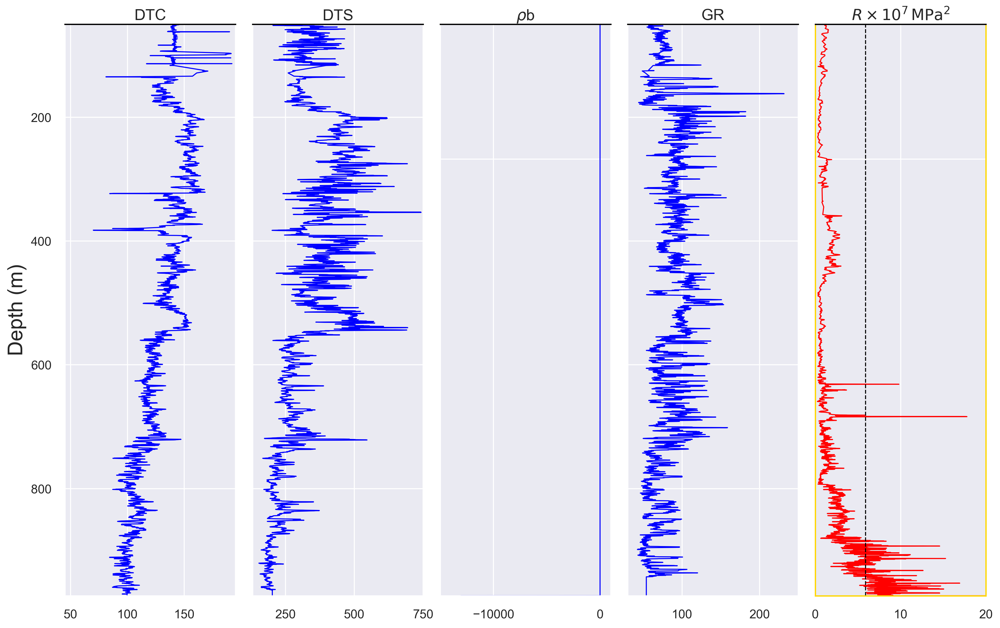

In [33]:
# Plotting the input features with the target
fig, axes = plt.subplots(figsize=(16, 10), dpi=300)
curve_names = ['DTC', 'DTS', r'$\rho$'+'b', 'GR', r'$R \times 10^7 \, \mathrm{MPa}^2$']

# Setup the plot axes and the individual log tracks / subplots
ax1 = plt.subplot2grid((1, 5), (0, 0), rowspan=1, colspan=1)
ax1.plot("DTC", "DEPT", data=C_WELLA, color="blue", lw=1)
ax1.set_xlim(45, 195)
ax1.set_ylabel('Depth (m)', fontsize=20)

ax2 = plt.subplot2grid((1, 5), (0, 1), rowspan=1, colspan=1)
ax2.plot("DTS", "DEPT", data=C_WELLA, color="blue", lw=1)
ax2.set_xlim(130, 750)

ax3 = plt.subplot2grid((1, 5), (0, 2), rowspan=1, colspan=1)
ax3.plot(r'$\rho$'+'b', "DEPT", data=C_WELLA, color="blue", lw=1)
ax3.set_xlim(-15000, 1000)
ax3.semilogy()

ax4 = plt.subplot2grid((1, 5), (0, 3), rowspan=1, colspan=1)
ax4.plot("GR", "DEPT", data=C_WELLA, color="blue", lw=1)
ax4.set_xlim(30, 250)

ax5 = plt.subplot2grid((1, 5), (0, 4), rowspan=1, colspan=1)
ax5.plot(r'$R \times 10^7 \, \text{MPa}^2$', "DEPT", data=C_WELLA, color="red", lw=1)
ax5.set_xlim(0, 20)
ax5.semilogy()
ax5.spines['right'].set_edgecolor('gold')
ax5.spines['left'].set_edgecolor('gold')
ax5.spines['bottom'].set_edgecolor('gold')

# Add a vertical line at 5.9 (adjusted for the correct context)
ax5.axvline(5.9, color="black", linestyle="--", linewidth=1)

# Setup the common elements between the subplots
for i, ax in enumerate(fig.axes):
    ax.set_ylim(973.226400, 49.530000)  # Set the depth range
    ax.locator_params(axis='x', nbins=2)
    ax.tick_params(labelsize=12)
    ax.set_xlabel(curve_names[i])
  
    ax.xaxis.set_label_position("top")
    ax.spines['top'].set_edgecolor('black')
    ax.set_xlabel(curve_names[i], fontsize=15)
         

# Hide tick labels on y-axis for all but the first plot
for ax in [ax2, ax3, ax4, ax5]:
    plt.setp(ax.get_yticklabels(), visible=False)

# Reduce space between subplots
fig.subplots_adjust(wspace=0.1)

# Display the plots
plt.show()

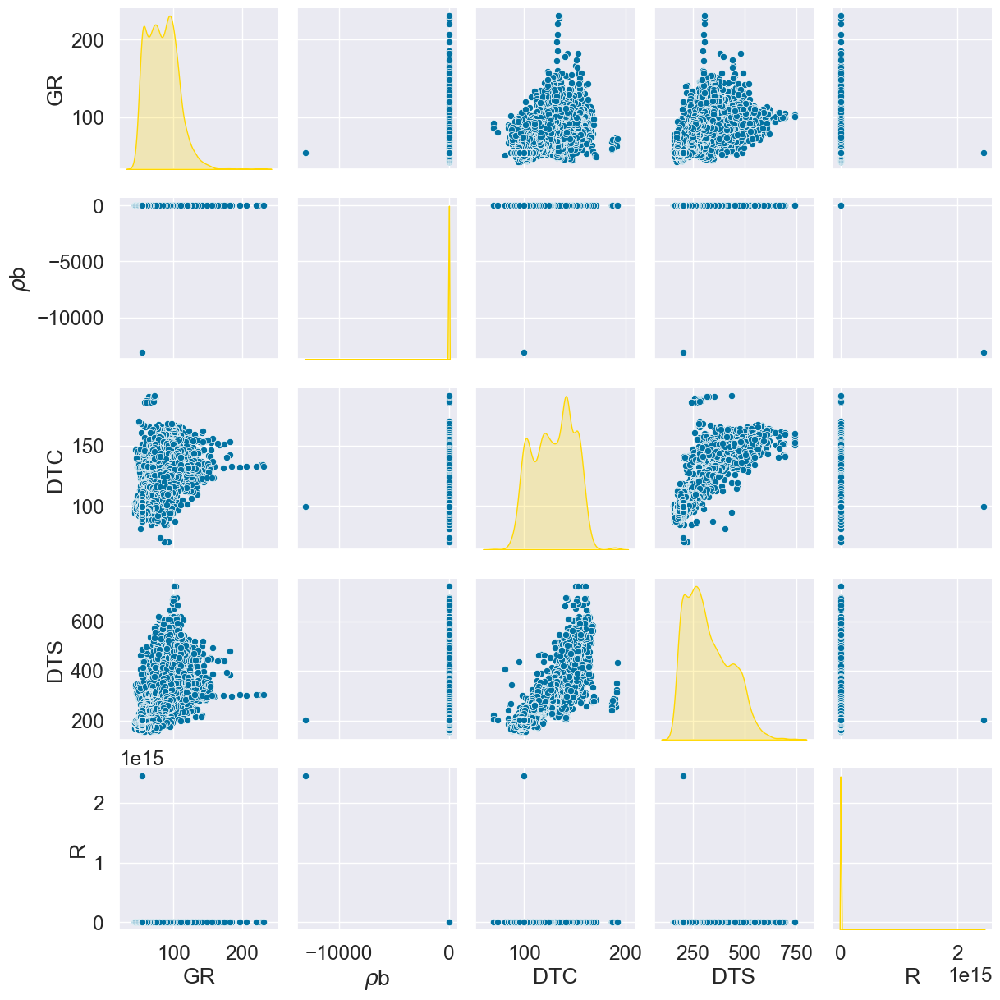

In [34]:
# Plotting the input features Vs. the target
# Set style and context for the plot
sns.set_style('darkgrid')
sns.set_context("notebook", font_scale=1.6)

# Select the inputs to be plotted
inputs = ['GR', r'$\rho$'+'b', 'DTC', 'DTS', 'R']

# Create pair plot with only the lower triangle of plots
sns.pairplot(C_WELLA[inputs], diag_kind='kde', diag_kws={'color':'gold'})

In [35]:
# convert DEPT column to string
C_WELLA['DEPT'] = C_WELLA['DEPT'].astype(str)

In [36]:
# Taking a copy of the data for later plotting
C_WELLAV = C_WELLA.copy()

In [37]:
# Specify the undeeded columns to be deleted
columns_to_delete = [r'$R \times 10^7 \, \text{MPa}^2$','B','Ec'] 

# Deleting the specified columns
C_WELLA.drop(columns=columns_to_delete, inplace=True)

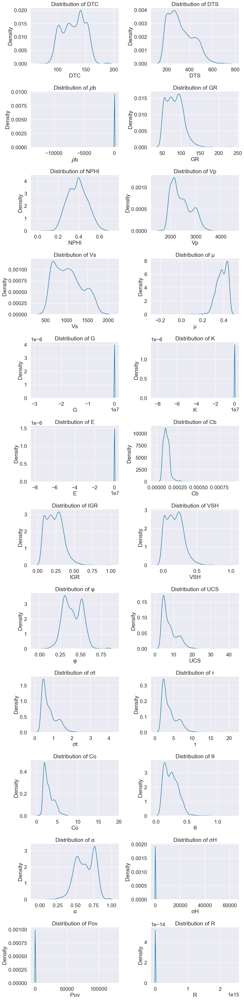

In [38]:
# At this step the distribution of the data will be checked to find out the data that needs
# to be transformed in order to be normally distributed
# First: Definining the columns we want to exclude from plotting
columns_to_exclude = ['DEPT']

# List of columns we want to plot
columns_to_plot = C_WELLA.drop(columns=columns_to_exclude).columns

# Set up the subplots (2 plots per row)
n_cols = 2
n_rows = (len(columns_to_plot) + 1) // n_cols  # Adjust for odd numbers

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 4))

# Flatten the axes array to make it easier to iterate
axes = axes.flatten()

# Loop through columns and plot on each axis
for i, col in enumerate(columns_to_plot):
    sns.kdeplot(C_WELLA[col].dropna(), ax=axes[i])  # KDE plot for distribution, excluding NaNs
    axes[i].set_title(f'Distribution of {col}')

# Remove extra subplots 
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

In [39]:
# Calculate skewness for all columns
skewness = C_WELLA.drop(columns=columns_to_exclude).skew()

# Display skewness values
print("Skewness of each column:\n", skewness)

# Identify columns with high skewness (typically > 0.75 indicates a need for log transformation)
high_skew = skewness[abs(skewness) > 0.75]
print("\nColumns that may need transformation:\n", high_skew)

Skewness of each column:
 DTC        -0.092738
DTS         0.617979
$\rho$b   -76.661457
GR          0.680223
NPHI        0.073561
Vp          0.589252
Vs          0.384899
μ          -1.291134
G         -76.659311
K         -76.660646
E         -76.659479
Cb          4.117076
IGR         0.680223
VSH         0.680223
φ           0.140434
UCS         1.237410
σt          1.254393
τ           1.237410
Co          1.755353
θ           1.008487
α          -0.282162
σH         76.660312
Pov        76.660306
R          76.661594
dtype: float64

Columns that may need transformation:
 $\rho$b   -76.661457
μ          -1.291134
G         -76.659311
K         -76.660646
E         -76.659479
Cb          4.117076
UCS         1.237410
σt          1.254393
τ           1.237410
Co          1.755353
θ           1.008487
σH         76.660312
Pov        76.660306
R          76.661594
dtype: float64


In [40]:
# Identify columns with high skewness (using the output from the previous step)
columns_to_transform = high_skew.index

# Initialize the Yeo-Johnson transformer
pt = PowerTransformer(method='yeo-johnson')

C_WELLA_yt = C_WELLA.copy()
C_WELLA_yt[columns_to_transform] = pt.fit_transform(C_WELLA[columns_to_transform])

# Check skewness after Yeo-Johnson transformation
print(pd.DataFrame(C_WELLA_yt, columns=columns_to_transform).head())

    $\rho$b         μ         G         K         E       Cb       UCS  \
0 -0.171524 -0.249901 -0.465161 -0.794257 -0.466051 0.858293 -0.773575   
1 -0.956228 -0.630604 -0.393742 -0.968383 -0.404089 1.162994 -0.697057   
2 -1.068109 -0.561423 -0.475670 -1.062315 -0.489256 1.340184 -0.895781   
3 -1.048699 -1.115592 -0.272443 -1.130592 -0.301427 1.474941 -0.780381   
4 -1.077283 -1.216876 -0.264918 -1.187111 -0.299963 1.590384 -0.853361   

         σt         τ        Co        θ        σH       Pov         R  
0  2.334945 -0.779315 -0.949771 0.258284 -2.849672 -2.813304 -0.335030  
1 -0.724859 -0.703343 -0.991726 0.635054 -2.847376 -2.809737 -0.356570  
2 -0.912685 -0.900295 -1.179386 0.566792 -2.844727 -2.806222 -0.517906  
3 -0.804225 -0.786064 -1.266180 1.111343 -2.843632 -2.802708 -0.342456  
4 -0.873016 -0.858351 -1.387066 1.210386 -2.841789 -2.799215 -0.377923  


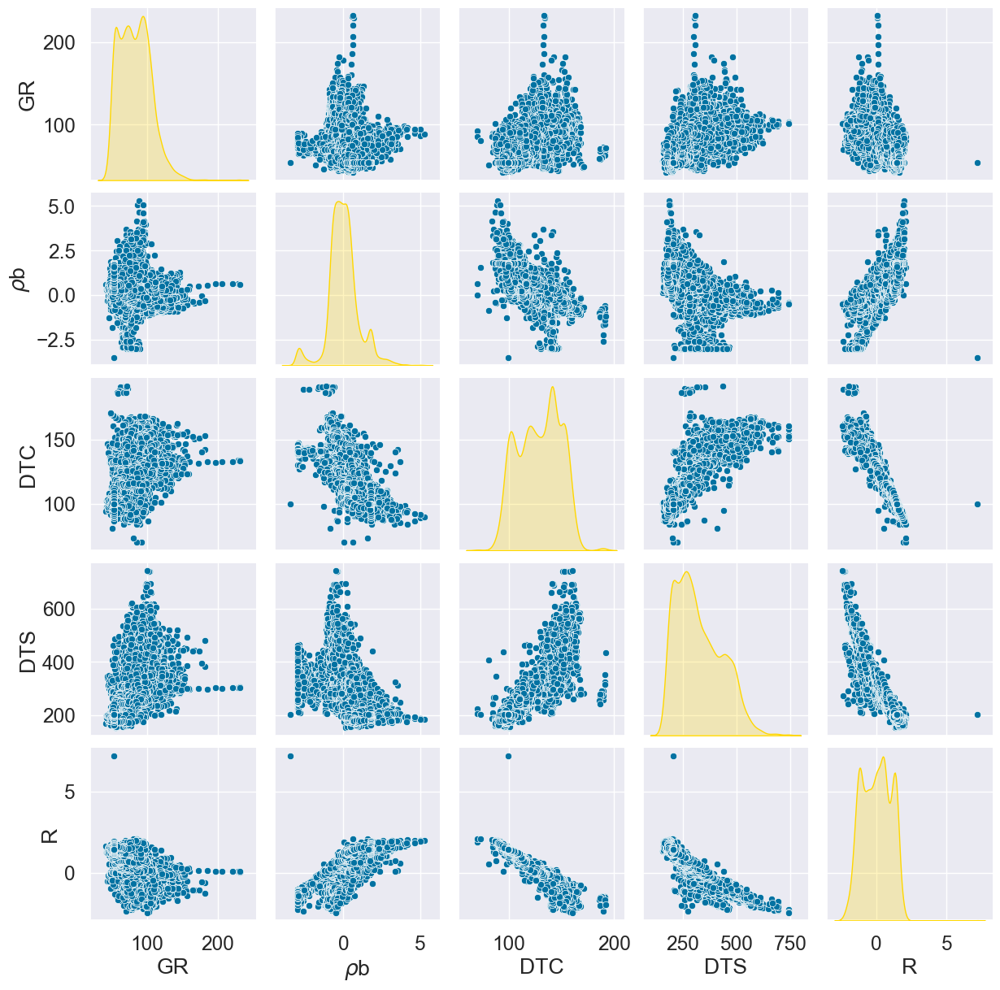

In [41]:
# Plotting the inputs and output after transformation
# Set style and context for the plot
sns.set_style('darkgrid')
sns.set_context("notebook", font_scale=1.6)

# Select the inputs to be plotted
inputs = ['GR', r'$\rho$'+'b', 'DTC', 'DTS', 'R']

# Create pair plot with only the lower triangle of plots
sns.pairplot(C_WELLA_yt[inputs], diag_kind='kde', diag_kws={'color':'gold'})

The previous step was so important, as the preprocessed data (DTC, DTS, 𝜌b) was used for the estimation of the required properties using MS Excel; after that, the file containing all these data was uploaded back to Jupyter notebook. The estimated properties were explored using multiple visualizations, and the distribution of the data columns was checked to find out the columns that needed to be transformed. The skewness of the columns was calculated, and the columns with high skewness were identified, and the Yeo-Johnson transformation technique was applied to them. This step could contribute greatly to the success of the model performance, as the transformation process could reduce the complexity that the model may exhibit later on, and this is clearly illustrated in the previous two pairplots, as the skewness was reduced greatly.

## (6) Feature Selection

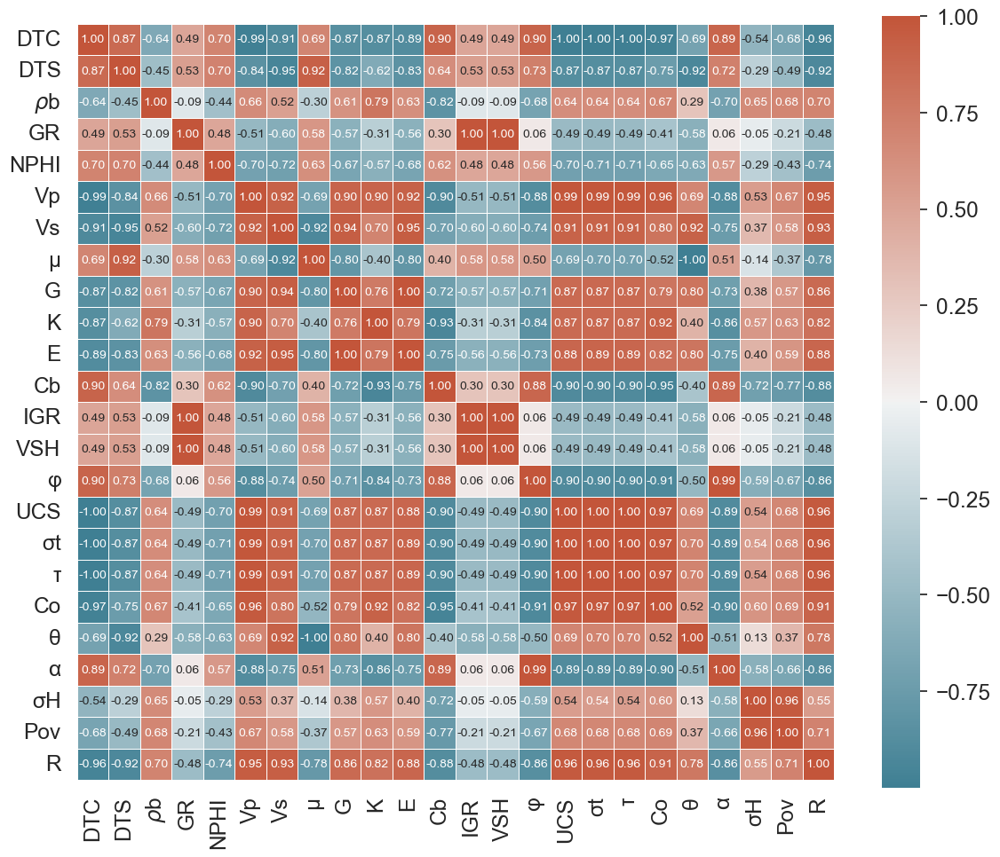

Pearson Correlation Coefficients with the Target Variable:
R          1.000000
σt         0.961612
τ          0.961490
UCS        0.961060
Vp         0.947799
Vs         0.932766
Co         0.905112
E          0.884646
G          0.864916
K          0.815268
θ          0.779546
Pov        0.709767
$\rho$b    0.697628
σH         0.553669
VSH       -0.476301
GR        -0.476301
IGR       -0.476301
NPHI      -0.738626
μ         -0.779004
α         -0.858437
φ         -0.860399
Cb        -0.875637
DTS       -0.920419
DTC       -0.960450
Name: R, dtype: float64


In [42]:
# Calculate the Pearson correlation matrix
corr_matrix = C_WELLA_yt.drop(columns=['DEPT']).corr()

# Set up the matplotlib figure for proper sizing
plt.figure(figsize=(12, 10))

# Create a custom color palette (blue for negative, orange for positive correlations)
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Create the heatmap with better sizing for annotations and square formatting
sns.heatmap(corr_matrix, 
            annot=True,                # Annotate with the correlation coefficients
            fmt='.2f',                 # Format the numbers to 2 decimal places
            cmap=cmap,                 # Using the blue-orange colormap
            center=0,                  # Ensure the color scale is centered at 0
            square=True,               # Ensure the squares remain square-shaped
            linewidths=0.5,            # Add lines between squares for better visibility
            annot_kws={"size": 10})    # Adjust annotation font size


# Display the plot
plt.tight_layout()
plt.show()

# Sort and display the correlation values with the target 
target_corr = corr_matrix['R'].sort_values(ascending=False)
print("Pearson Correlation Coefficients with the Target Variable:")
print(target_corr)

Choosing the optimal features and ordering them correctly are two necessary steps, as they could help in reducing overfitting and the training time that the model might take. From Pearson's correlation matrix, it's clear that there's a strong relationship between the input features and the target; however, there are some features that have the same or similar relation with the target and with each other. To avoid multicollinearity, if two input features have a high correlation with each other (e.g., > 0.90), the one that has the weaker correlation to the target was excluded and the stronger was kept for modeling to avoid any potential overfitting that maight occur to the model. The order of the inputs is as follows: (UCS / E / φ / K / θ / μ / Pov / 𝜌b).

# (7) Data Splitting into Training / Testing Sets
The dataset will be split (70% for the training set and 30% for the test set)

## Develpoing the first case models
Here two models will be developed (SVM and LightGBM), and the input features will be the logging data (DTC, DTS, 𝜌b). After data splitting into training and testing sets, they will be transformed using Yeo-Johnson technique separately to prevent any data leakage that could cause any errors, and finally, only the input features would be scaled using MinMaxScaler. 

In [43]:
# Taking a copy of the data for the second case models
C_WELLA1 = C_WELLAV.copy()

In [44]:
# Defining the input features and output feature
Features = ['DTC', 'DTS', r'$\rho$'+'b'] 
Target = ['R']

x = C_WELLAV[Features]  
y = C_WELLAV[Target]  

# Splitting the data into training and testing sets with shuffling 
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42, shuffle=True)

# Appling Yeo-Johnson transformation on the features 
pt_features = PowerTransformer(method='yeo-johnson')

# Fitting the transformation on the training data and transform both of the sets
x_train_yt = pt_features.fit_transform(x_train)
x_test_yt = pt_features.transform(x_test)

# Appling Yeo-Johnson transformation on the target
pt_target = PowerTransformer(method='yeo-johnson')

# Fitting the transformation on the training data and transform both of sets
y_train_yt = pt_target.fit_transform(y_train)
y_test_yt = pt_target.transform(y_test)

# Instantiate the MinMaxScaler
s_features = MinMaxScaler()

# Fitting the scaler on the training data and transform both of sets
x_train_scaled = s_features.fit_transform(x_train_yt)
x_test_scaled = s_features.transform(x_test_yt)

# Taking copies of the data
x_train_scaled1 = x_train_scaled.copy()
x_test_scaled1 = x_test_scaled.copy()
y_train_yt1 = y_train_yt.copy()
y_test_yt1 = y_test_yt.copy()

# (8) Selecting & Tuning Algorithm
At this step the algorithms to be used will be imported and the hyperparameters' values to be optimized through valiation curves that give the best performance of the models will be identified.

In [45]:
# Importing Support Vector Regressor from Scikit Learn
from sklearn.svm import SVR

In [46]:
# Installing Light Gradient Bossting Machine
!pip install lightgbm

In [47]:
# Creating a SVR & LighGBM Regressors
SVR1 = SVR()
LGBM1 = lgb.LGBMRegressor()

## Validation Curves of SVR Hyperparameters

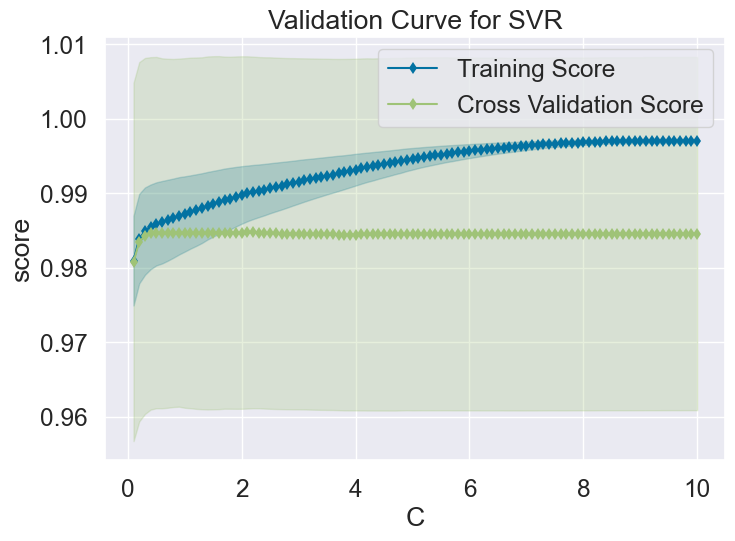

<AxesSubplot:title={'center':'Validation Curve for SVR'}, xlabel='C', ylabel='score'>

In [48]:
# Creating a validation curve visualizer for C
visualization = ValidationCurve(
   SVR(), param_name="C", param_range=np.arange(0.1, 10+0.1, 0.1), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(x_train_scaled, y_train_yt)
visualization.show()

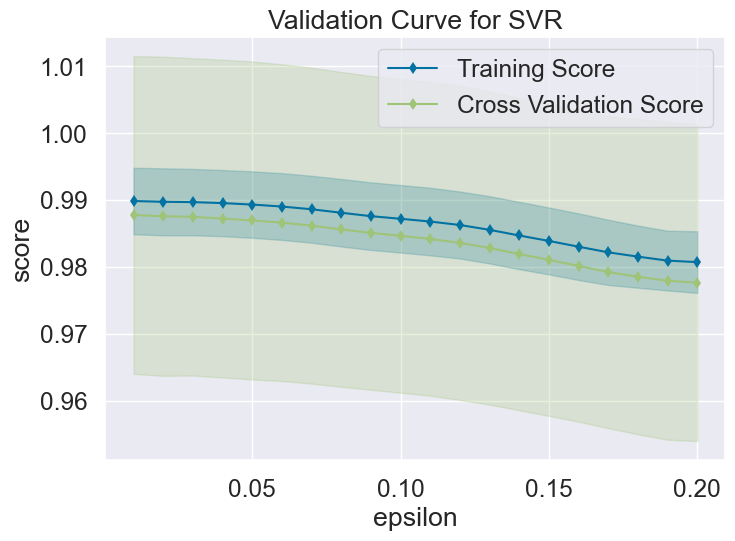

<AxesSubplot:title={'center':'Validation Curve for SVR'}, xlabel='epsilon', ylabel='score'>

In [49]:
# Creating a validation curve visualizer for epsilon
visualization = ValidationCurve(
   SVR(), param_name="epsilon", param_range=np.arange(0.01, 0.2+0.01, 0.01), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(x_train_scaled, y_train_yt)
visualization.show()

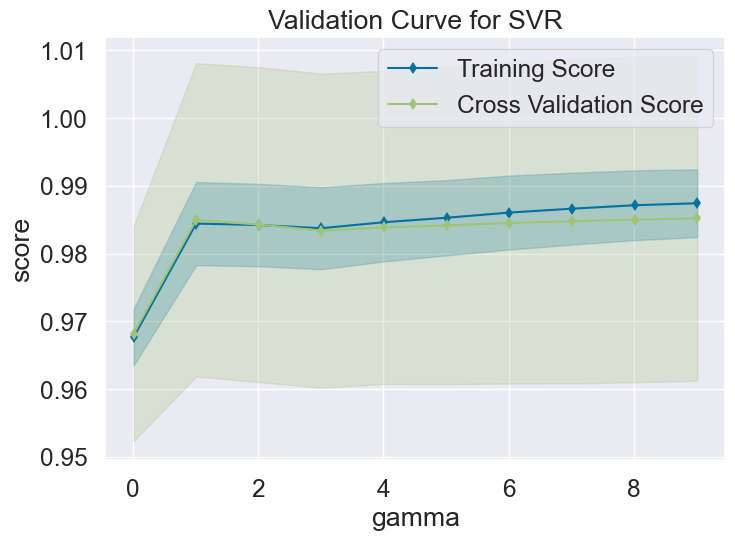

<AxesSubplot:title={'center':'Validation Curve for SVR'}, xlabel='gamma', ylabel='score'>

In [50]:
# Creating a validation curve visualizer for gamma
visualization = ValidationCurve(
   SVR(), param_name="gamma", param_range=np.arange(0.01, 10), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(x_train_scaled, y_train_yt)
visualization.show()

## Validation Curves of LightGBM Hyperparameters 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 329

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training fro

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training fro

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training f

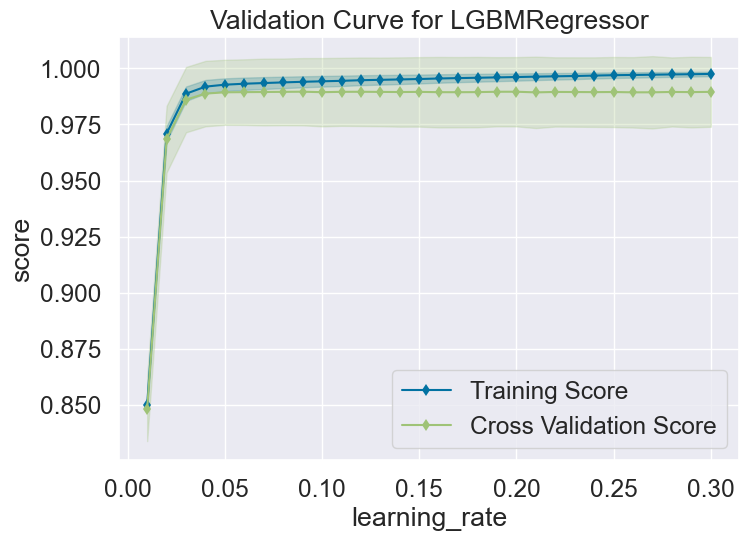

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='learning_rate', ylabel='score'>

In [51]:
# Creating a validation curve visualizer for learning rate
visualization = ValidationCurve(
   lgb.LGBMRegressor(), param_name="learning_rate", param_range=np.arange(0.0, 0.3+0.01, 0.01), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(x_train_scaled1, y_train_yt1)
visualization.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000216 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train se

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

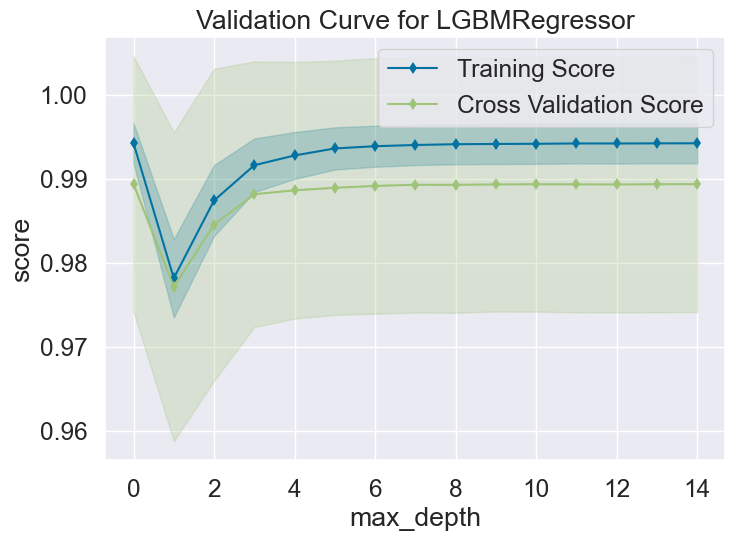

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='max_depth', ylabel='score'>

In [52]:
# Creating a validation curve visualizer for max depth
visualization = ValidationCurve(
    lgb.LGBMRegressor(), param_name="max_depth", param_range=np.arange(0, 15), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(x_train_scaled1, y_train_yt1)
visualization.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000232 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training fro

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training fro

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training fro

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training f

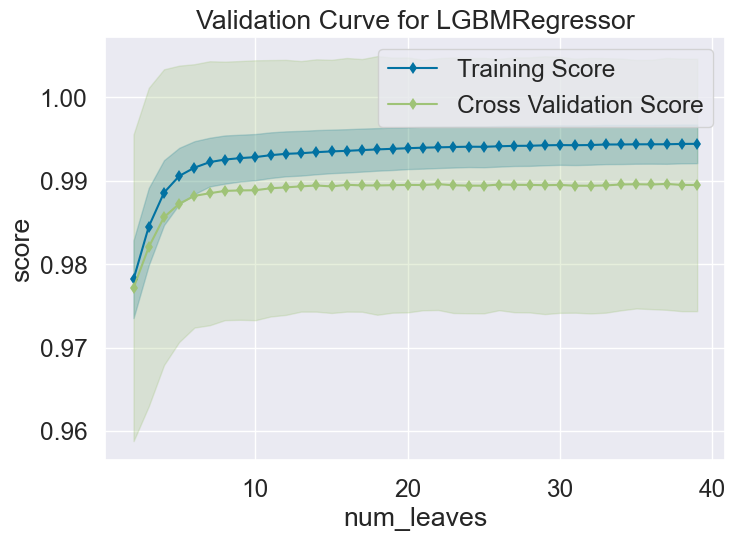

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='num_leaves', ylabel='score'>

In [53]:
# Creating a validation curve visualizer for num leaves
visualization = ValidationCurve(
    lgb.LGBMRegressor(), param_name="num_leaves", param_range=np.arange(0, 40), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(x_train_scaled1, y_train_yt1)
visualization.show()

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] feature_fraction is

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.1
[LightGBM] [Warning] feature_fraction is set=1.2000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.2000000000000002
[LightGBM] [Warning] feature_fraction is set=1.3000000000000003, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.3000000000000003
[LightGBM] [Warning] feature_fraction is set=1.4000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.4000000000000001
[LightGBM] [Warning] feature_fraction is set=1.5000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.5000000000000002
[LightGBM] [

[LightGBM] [Warning] feature_fraction is set=9.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.0
[LightGBM] [Warning] feature_fraction is set=9.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.1
[LightGBM] [Warning] feature_fraction is set=9.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.2
[LightGBM] [Warning] feature_fraction is set=9.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.3
[LightGBM] [Warning] feature_fraction is set=9.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.4
[LightGBM] [Warning] feature_fraction is set=9.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.5
[LightGBM] [Warning] feature_fraction is set=9.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.6
[LightGBM] [Warning] feature_fraction is set=9.700000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fractio

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.1
[LightGBM] [Warning] feature_fraction is set=1.2000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.2000000000000002
[LightGBM] [Warning] feature_fraction is set=1.3000000000000003, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.3000000000000003
[LightGBM] [Warning] feature_fraction is set=1.4000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.4000000000000001
[LightGBM] [Warning] feature_fraction is set=1.5000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.5000000000000002
[LightGBM] [

[LightGBM] [Warning] feature_fraction is set=9.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.5
[LightGBM] [Warning] feature_fraction is set=9.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.6
[LightGBM] [Warning] feature_fraction is set=9.700000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.700000000000001
[LightGBM] [Warning] feature_fraction is set=9.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.8
[LightGBM] [Warning] feature_fraction is set=9.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=9.9
[LightGBM] [Warning] feature_fraction is set=10.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=10.0
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value:

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.1
[LightGBM] [Warning] feature_fraction is set=1.2000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.2000000000000002
[LightGBM] [Warning] feature_fraction is set=1.3000000000000003, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.3000000000000003
[LightGBM] [Warning] feature_fraction is set=1.4000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.4000000000000001
[LightGBM] [Warning] feature_fraction is set=1.5000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.5000000000000002
[LightGBM] [

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] feature_fraction is 

[LightGBM] [Warning] feature_fraction is set=4.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=4.6
[LightGBM] [Warning] feature_fraction is set=4.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=4.7
[LightGBM] [Warning] feature_fraction is set=4.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=4.8
[LightGBM] [Warning] feature_fraction is set=4.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=4.9
[LightGBM] [Warning] feature_fraction is set=5.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.0
[LightGBM] [Warning] feature_fraction is set=5.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.1
[LightGBM] [Warning] feature_fraction is set=5.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.2
[LightGBM] [Warning] feature_fraction is set=5.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.3
[LightGB

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current valu

[LightGBM] [Warning] feature_fraction is set=6.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.9
[LightGBM] [Warning] feature_fraction is set=7.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=7.0
[LightGBM] [Warning] feature_fraction is set=7.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=7.1
[LightGBM] [Warning] feature_fraction is set=7.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=7.2
[LightGBM] [Warning] feature_fraction is set=7.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=7.3
[LightGBM] [Warning] feature_fraction is set=7.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=7.4
[LightGBM] [Warning] feature_fraction is set=7.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=7.5
[LightGBM] [Warning] feature_fraction is set=7.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=7.6
[LightGB

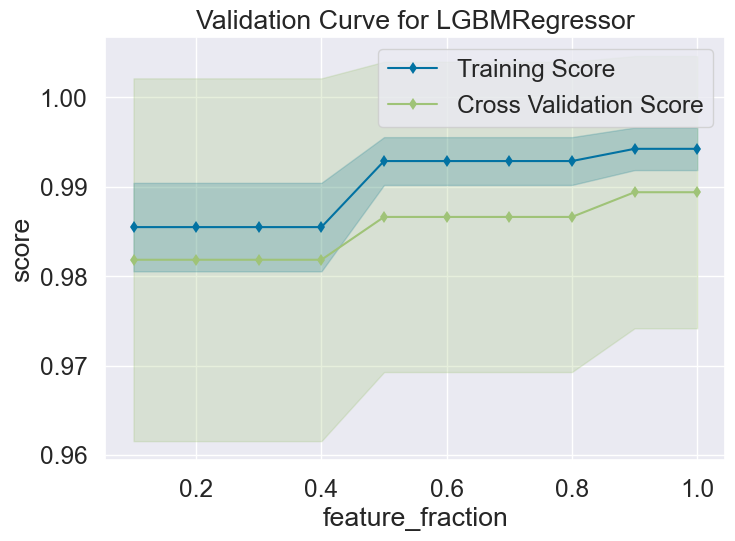

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='feature_fraction', ylabel='score'>

In [54]:
# Creating a validation curve visualizer for feature fraction
visualization = ValidationCurve(
    lgb.LGBMRegressor(), param_name="feature_fraction", param_range=np.arange(0.1, 10+0.1, 0.1), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(x_train_scaled1, y_train_yt1)
visualization.show()

[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the over

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000199 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
[LightGBM] [Warning] lambda_l1 is set=7, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7
[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM]

[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=49, reg_alpha=0.0 will be ignored. Current value: lambda_l1=49
[LightGBM] [Warning] lambda_l1 is set=49, reg_alpha=0.0 will be ignored. Current value: lambda_l1=49
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000244 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=44, reg_alpha=0.0 will be ignored. Current value: lambda_l1=44
[LightGBM] [Warning] lambda_l1 is set=44, reg_alpha=0.0 will be ignored. Current value: lambda_l1=44
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the ov

[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000213 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] lambda_l1 is set=34, reg_alpha=0.0 will be ignored. Current value: lambda_l1=34
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=44, reg_alpha=0.0 will be ignored. Current value: lambda_l1=44
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

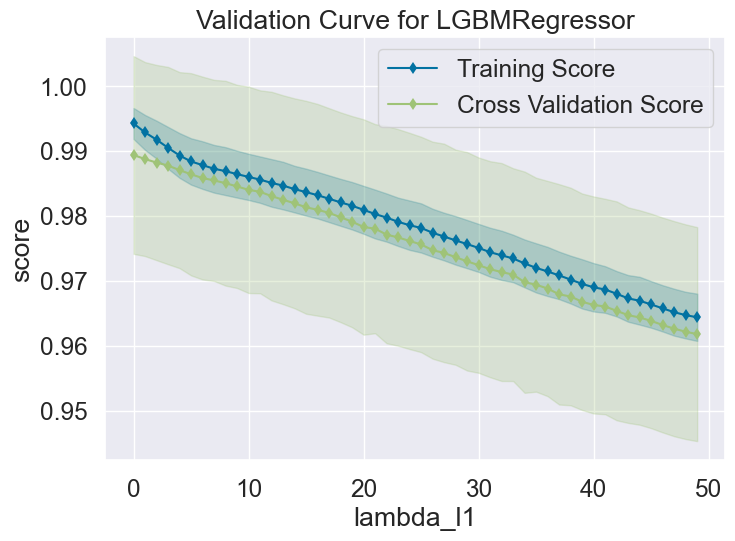

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='lambda_l1', ylabel='score'>

In [55]:
# Create the validation curve visualizer for lambda_l1
viz_l1 = ValidationCurve(
    lgb.LGBMRegressor(), param_name="lambda_l1", param_range=np.arange(0, 50), cv=5, scoring="r2", n_jobs=-1
)

# Fit and show the visualizer for lambda_l1
viz_l1.fit(x_train_scaled1, y_train_yt1)
viz_l1.show()

[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, th

[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000234 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17
[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=22, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22
[LightGBM] [Warning] lambda_l2 is set=22, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22
[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=27, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27
[LightGBM] [Warning] lambda_l2 is set=27, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Warning] lambda_l2 is set=39, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39
[LightGBM] [Warning] lambda_l2 is set=39, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] lambda_l2 is set=43, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43
[LightGBM] [Warning] lambda_l2 is set=43, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=71, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71
[LightGBM] [Warning] lambda_l2 is set=71, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[LightGBM] [Warning] lambda_l2 is set=83, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 

[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17
[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=27, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27
[LightGBM] [Warning] lambda_l2 is set=27, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27
[LightGBM] [Warning] lambda_l2 is set=28, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28
[LightGBM] [Warning] lambda_l2 is set=28, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Warning] lambda_l2 is set=32, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32
[LightGBM] [Warning] lambda_l2 is set=32, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] lambda_l2 is set=36, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36
[LightGBM] [Warning] lambda_l2 is set=36, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=39, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39
[LightGBM] [Warning] lambda_l2 is set=39, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=43, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43
[LightGBM] [Warning] lambda_l2 is set=43, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43
[LightGBM] [Warning] lambda_l2 is set=44, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44
[LightGBM] [Warning] lambda_l2 is set=44, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=64, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64
[LightGBM] [Warning] lambda_l2 is set=64, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000180 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will 

[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Warning] lambda_l2 is set=13, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13
[LightGBM] [Warning] lambda_l2 is set=13, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Warning] lambda_l2 is set=19, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19
[LightGBM] [Warning] lambda_l2 is set=19, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to r

[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overh

[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000176 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will 

[LightGBM] [Warning] lambda_l2 is set=13, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13
[LightGBM] [Warning] lambda_l2 is set=13, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13
[LightGBM] [Warning] lambda_l2 is set=14, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14
[LightGBM] [Warning] lambda_l2 is set=14, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=19, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19
[LightGBM] [Warning] lambda_l2 is set=19, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Warning] lambda_l2 is set=5, reg_lambda=0.0 will

[LightGBM] [Warning] lambda_l2 is set=13, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13
[LightGBM] [Warning] lambda_l2 is set=13, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13
[LightGBM] [Warning] lambda_l2 is set=14, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14
[LightGBM] [Warning] lambda_l2 is set=14, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000168 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=19, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19
[LightGBM] [Warning] lambda_l2 is set=19, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overh

[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] lambda_l2 is set=43, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43
[LightGBM] [Warning] lambda_l2 is set=43, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] lambda_l2 is set=46, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000177 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambd

[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Warning] lambda_l2 is set=74, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] lambda_l2 is set=86, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 3
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

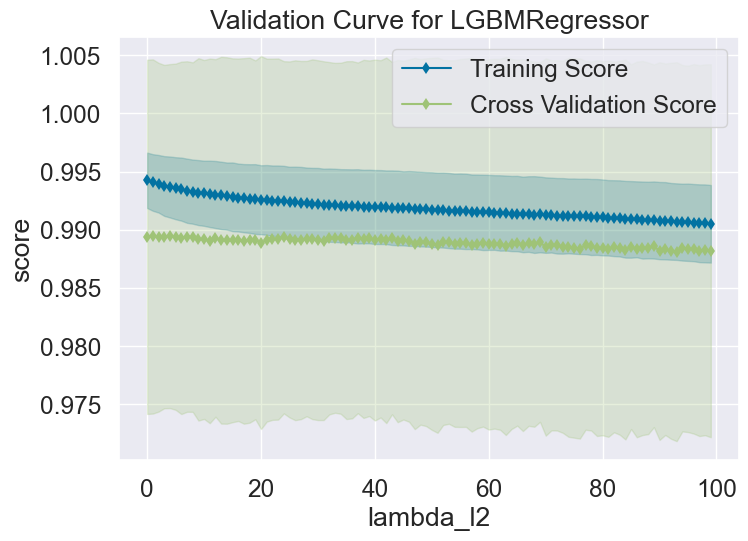

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='lambda_l2', ylabel='score'>

In [56]:
# Create the validation curve visualizer for lambda_l2
viz_l2 = ValidationCurve(
    lgb.LGBMRegressor(), param_name="lambda_l2", param_range=np.arange(0, 100), cv=5, scoring="r2", n_jobs=-1
)

# Fit and show the visualizer for lambda_l2
viz_l2.fit(x_train_scaled1, y_train_yt1)
viz_l2.show()

To specify the optimal values of the hyperparameters, they have to be analyzed deeply and carefully. There are two curves (training score and validation scores). The region where the validation score is at its peak and at the same time the gap between it and the training score curve is small. The values in this region are likely the best values for the hyperparameter where the model balances bias and variance effectively, and this indicates a good generalization of the model.

## (9) Building the Model with Training Set & Evaluate with Testing Set

# 1. SVR Algorithm

In [57]:
# Function to calculate adjusted R²
def adjusted_r2(r2, n, p):
    return 1 - ((1 - r2) * (n - 1) / (n - p - 1))

# Define the model
SVR1 =  SVR()

# Defining the parameter grid for SVR
param_grid = {
    'C':[0.1,0.2,0.3],
    'epsilon': [0.01,0.02,0.03,0.04],
    'gamma': [0.01,0.1,1,2],
    'kernel':['poly','sigmoid']
}

# Initializing HalvingGridSearchCV
halving_grid_search = HalvingGridSearchCV(
    estimator=SVR1,
    param_grid=param_grid,
    factor=2,  # Halving factor 
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available cores
    verbose=2  # Display progress
)

# Fitting the HalvingGridSearchCV to the training data
halving_grid_search.fit(x_train_scaled, y_train_yt)

# Getting the best hyperparameters and model
best_model = halving_grid_search.best_estimator_
print(f"Best Hyperparameters: {halving_grid_search.best_params_}")

n_iterations: 7
n_required_iterations: 7
n_possible_iterations: 7
min_resources_: 64
max_resources_: 4113
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 96
n_resources: 64
Fitting 5 folds for each of 96 candidates, totalling 480 fits
----------
iter: 1
n_candidates: 48
n_resources: 128
Fitting 5 folds for each of 48 candidates, totalling 240 fits
----------
iter: 2
n_candidates: 24
n_resources: 256
Fitting 5 folds for each of 24 candidates, totalling 120 fits
----------
iter: 3
n_candidates: 12
n_resources: 512
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 4
n_candidates: 6
n_resources: 1024
Fitting 5 folds for each of 6 candidates, totalling 30 fits
----------
iter: 5
n_candidates: 3
n_resources: 2048
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 6
n_candidates: 2
n_resources: 4096
Fitting 5 folds for each of 2 candidates, totalling 10 fits
Best Hyperparameters: {'C': 0.2, 'epsilon': 0.04, 'gamma'

In [58]:
# Number of features (p)
p = x_train_scaled.shape[1]

# Evaluating the model on training set  
y_train_pred = best_model.predict(x_train_scaled)
r2_train = r2_score(y_train_yt, y_train_pred)
adjusted_r2_train = adjusted_r2(r2_train, len(y_train_yt), p)
rmse_train = mean_squared_error(y_train_yt, y_train_pred, squared=False)
mae_train = mean_absolute_error(y_train_yt, y_train_pred)

print("Training Set Results:")
print(f"R²: {r2_train:.4f}")
print(f"Adjusted R²: {adjusted_r2_train:.4f}")
print(f"RMSE: {rmse_train:.4f}")
print(f"MAE: {mae_train:.4f}\n")

# Evaluating the model on test set
y_test_pred = best_model.predict(x_test_scaled)
r2_test1 = r2_score(y_test_yt, y_test_pred)
adjusted_r2_test = adjusted_r2(r2_test1, len(y_test_yt), p)
rmse_test1 = mean_squared_error(y_test_yt, y_test_pred, squared=False)
mae_test1 = mean_absolute_error(y_test_yt, y_test_pred)

print("Test Set Results:")
print(f"R²: {r2_test1:.4f}")
print(f"Adjusted R²: {adjusted_r2_test:.4f}")
print(f"RMSE: {rmse_test1:.4f}")
print(f"MAE: {mae_test1:.4f}")

Training Set Results:
R²: 0.9059
Adjusted R²: 0.9058
RMSE: 0.3068
MAE: 0.1440

Test Set Results:
R²: 0.9046
Adjusted R²: 0.9044
RMSE: 0.3096
MAE: 0.1548


# 2. LightGBM Algorithm

In [59]:
# Define the model
LGBM1 =  lgb.LGBMRegressor()

# Define the parameter grid for Random Forest
param_grid = {
    'learning_rate':[0.04,0.05, 0.06],
    'max_depth': [6,8,10],
    'feature_fraction': [0.6,0.9,1.0],
    'num_leaves': [14,22,30],
    'lambda_l1':[50],
    'lambda_l2': [69,95,100]
}

# Initialize HalvingGridSearchCV
halving_grid_search = HalvingGridSearchCV(
    estimator=LGBM1,
    param_grid=param_grid,
    factor=2,  # Halving factor 
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available cores
    verbose=2  # Display progress
)

# Fit the HalvingGridSearchCV to the training data
halving_grid_search.fit(x_train_scaled1, y_train_yt1)

# Get the best hyperparameters and model
best_model1 = halving_grid_search.best_estimator_
print(f"Best Hyperparameters: {halving_grid_search.best_params_}")

n_iterations: 8
n_required_iterations: 8
n_possible_iterations: 8
min_resources_: 32
max_resources_: 4113
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 243
n_resources: 32
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
----------
iter: 1
n_candidates: 122
n_resources: 64
Fitting 5 folds for each of 122 candidates, totalling 610 fits
----------
iter: 2
n_candidates: 61
n_resources: 128
Fitting 5 folds for each of 61 candidates, totalling 305 fits
----------
iter: 3
n_candidates: 31
n_resources: 256
Fitting 5 folds for each of 31 candidates, totalling 155 fits
----------
iter: 4
n_candidates: 16
n_resources: 512
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 5
n_candidates: 8
n_resources: 1024
Fitting 5 folds for each of 8 candidates, totalling 40 fits
----------
iter: 6
n_candidates: 4
n_resources: 2048
Fitting 5 folds for each of 4 candidates, totalling 20 fits
----------
iter: 7
n_candidates: 2
n_resources: 409

In [60]:
# Number of features (p)
p = x_train_scaled1.shape[1]

# Evaluating the model on training set
y_train_pred1 = best_model1.predict(x_train_scaled1)
R2_train = r2_score(y_train_yt1, y_train_pred1)  
Adjusted_r2_train = adjusted_r2(R2_train, len(y_train_yt1), p)
Rmse_train = mean_squared_error(y_train_yt1, y_train_pred1, squared=False)
Mae_train = mean_absolute_error(y_train_yt1, y_train_pred1)

print("Training Set Results:")
print(f"R²: {R2_train:.4f}")
print(f"Adjusted R²: {Adjusted_r2_train:.4f}")
print(f"RMSE: {Rmse_train:.4f}")
print(f"MAE: {Mae_train:.4f}\n")

# Evaluating the model on test set
y_test_pred1 = best_model1.predict(x_test_scaled1)
R2_test1 = r2_score(y_test_yt1, y_test_pred1)  
Adjusted_r2_test1 = adjusted_r2(R2_test1, len(y_test_yt1), p)
Rmse_test1 = mean_squared_error(y_test_yt1, y_test_pred1, squared=False)
Mae_test1 = mean_absolute_error(y_test_yt1, y_test_pred1)

print("Test Set Results:")
print(f"R²: {R2_test1:.4f}")
print(f"Adjusted R²: {Adjusted_r2_test1:.4f}")
print(f"RMSE: {Rmse_test1:.4f}")
print(f"MAE: {Mae_test1:.4f}")

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
Training Set Results:
R²: 0.9630
Adjusted R²: 0.9629
RMSE: 0.1925
MAE: 0.1005

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
Test Set Results:
R²: 0.9685
Adjusted R²: 0.9684
RMSE: 0.1779
MAE: 0.1028


## (10) Assessing Models Performance 

### Plotting Learning Curve of the Two Models

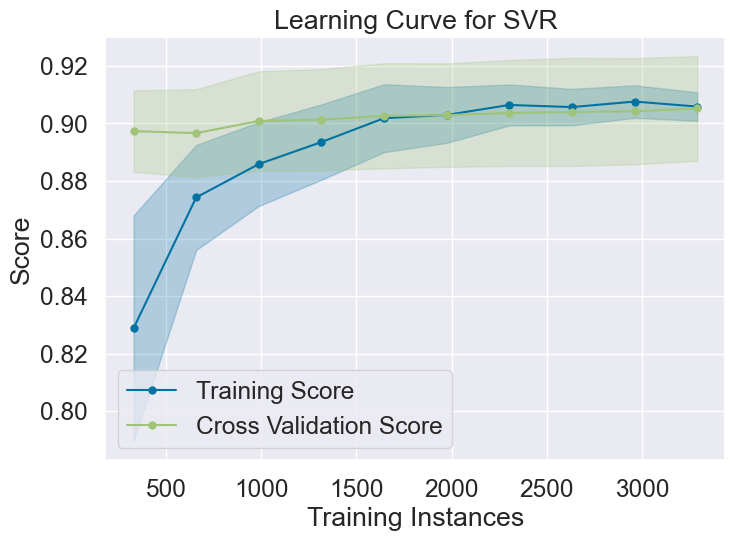

<AxesSubplot:title={'center':'Learning Curve for SVR'}, xlabel='Training Instances', ylabel='Score'>

In [61]:
# Instantiate the LearningCurve visualizer for SVR
lc1 = LearningCurve(
    best_model,
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # Evaluation metric
    train_sizes=np.linspace(0.1, 1.0, 10)  # Training set sizes
)

# Fitting the visualizer to the scaled and transformed training data
lc1.fit(x_train_scaled, y_train_yt)
lc1.show()

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 330
[LightGBM] [Info] Number of data points in the train set: 329, number of used features: 3
[LightGBM] [Info] Start training from score 0.072492
[Lig

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000088 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 1974, number of used features: 3
[LightGBM] [Info] Start training from score -0.013858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 2961, number of used features: 3
[LightGBM] [Info] Start training from score -0.009772
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [W

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [W

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 2303, number of used features: 3
[LightGBM] [Info] Start training from score -0.003549
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [W

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [I

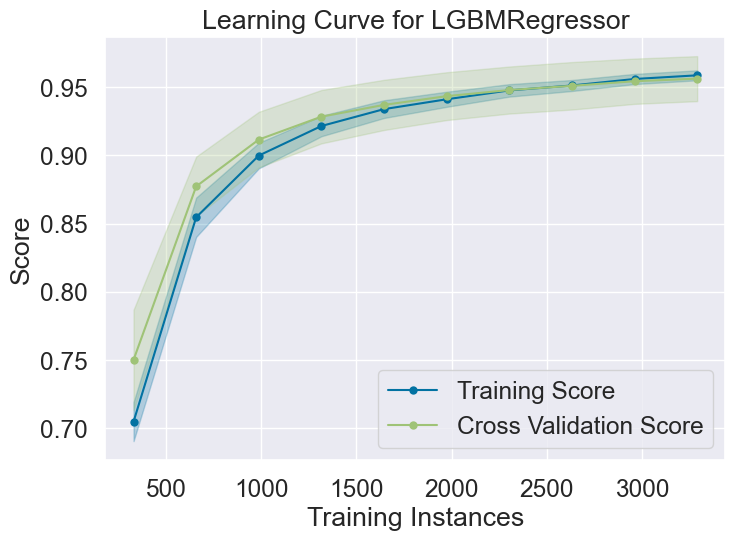

<AxesSubplot:title={'center':'Learning Curve for LGBMRegressor'}, xlabel='Training Instances', ylabel='Score'>

In [62]:
# Instantiate the LearningCurve visualizer
LC1 = LearningCurve(
    best_model1,
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # Evaluation metric
    train_sizes=np.linspace(0.1, 1.0, 10)  # Training set sizes
)

# Fitting the visualizer to the scaled and transformed training data
LC1.fit(x_train_scaled1, y_train_yt1)
LC1.show()

As illustrated in the previous figures, both models showed a good performance. On both figures the training and cross-validation scores converge together as more data is added, so they wouldn't benefit from more data.

* Training Score: The training curve increases with more data in the two models. It increases rapidly in LightGBM model and eventually stabilizes at a score close to 0.95, and in SVR it  steadily increases with more data, stabilizing at around 0.91. This suggests that SVR is also capable of learning effectively but has a slightly lower performance ceiling.

* Cross-Validation Score: The cross-validation curve of SVR is slightly above the training curve initially and then aligns closely with it as training instances increase. This indicates a slightly better generalization compared to LightGBM in this case, but at the cost of a lower maximum score.

* Bias-Variance Tradeoff: SVR shows moderate bias and low variance, compared to the LightGBM that shows low bias and low variance which is ideal for generalization. SVR model is more conservative in its learning and might require further optimization for higher performance.

SVR is robust and generalizes well, but it does not achieve the same performance as LightGBM without additional tuning, which supports our approach for enhancing the prediction of sanding by incorporating the mechanical properties of the formation.

### Plotting Cross-Validation Curve of the Two Models 

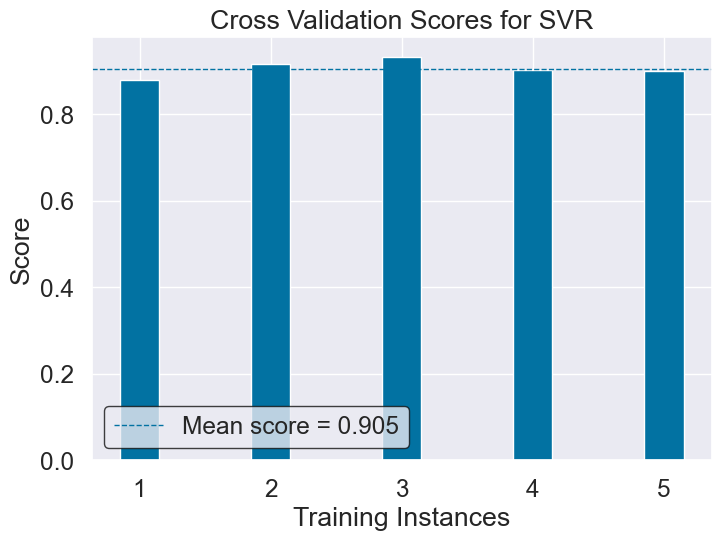

<AxesSubplot:title={'center':'Cross Validation Scores for SVR'}, xlabel='Training Instances', ylabel='Score'>

In [63]:
# Instantiate and fitting the CVScores visualizer for SVR model
visualizer = CVScores(best_model, cv=5, scoring='r2')
visualizer.fit(x_train_scaled, y_train_yt)
visualizer.show()

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=50, reg_alpha=0.0 will be ignored. Current value: lambda_l1=50
[LightGBM] [Warning] lambda_l2 is set=100, reg_lambda=0.0 will be ignored. Current value: lambda_l2=100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 765
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 3
[LightGBM] [Info] Start training from score -0.000429
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

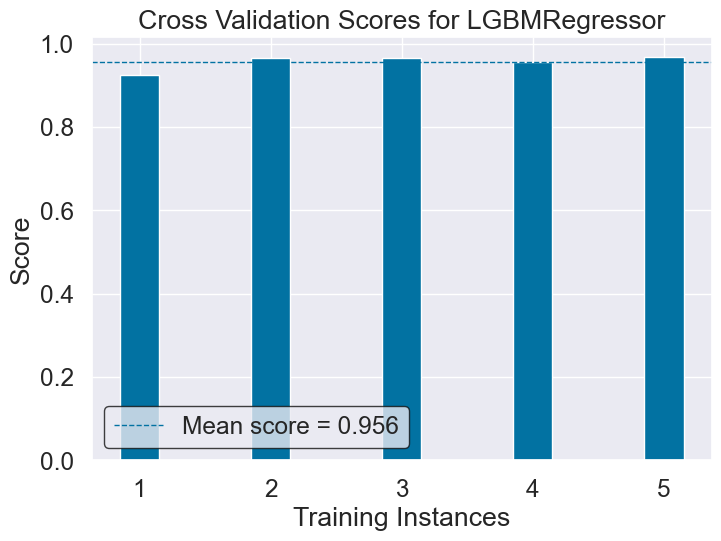

<AxesSubplot:title={'center':'Cross Validation Scores for LGBMRegressor'}, xlabel='Training Instances', ylabel='Score'>

In [64]:
# Instantiate and fitting the CVScores visualizer for LighGBM model
visualizer = CVScores(best_model1, cv=5, scoring='r2')
visualizer.fit(x_train_scaled1, y_train_yt1)
visualizer.show()

The mean score for cross-validation of SVR is 0.906, which is consistent with the R² of the training and test sets (both around 0.906), and for LighGBM is 0.956 which is consistent as well with the training and test sets, and that indicates a good performance of the two models, however, SVR model shows a lower performance than LighGBM.

### Denormalization of the Target Data Sets

In [65]:
# Step 1: Inverse Yeo Johnson Transformation of the target for SVR model
y_train_yt_original, y_train_pred_original = pt_target.inverse_transform(y_train_yt.reshape(-1,1)), pt_target.inverse_transform(y_train_pred.reshape(-1,1))
y_test_yt_original, y_test_pred_original = pt_target.inverse_transform(y_test_yt.reshape(-1,1)), pt_target.inverse_transform(y_test_pred.reshape(-1,1))

In [66]:
# Step 2: Inverse Yeo Johnson Transformation of the target for LighGBM model
y_train_yt1_original, y_train_pred1_original = pt_target.inverse_transform(y_train_yt1.reshape(-1,1)), pt_target.inverse_transform(y_train_pred1.reshape(-1,1))
y_test_yt1_original, y_test_pred1_original = pt_target.inverse_transform(y_test_yt1.reshape(-1,1)), pt_target.inverse_transform(y_test_pred1.reshape(-1,1))

### Plotting the Crossplots of the Actual Vs. the Predicted Target

In [67]:
# Divide each variable by 10^7

y_train_yt_original /= 1e7
y_train_pred_original /= 1e7
y_test_yt_original /= 1e7
y_test_pred_original /= 1e7
y_train_yt1_original /= 1e7
y_train_pred1_original /= 1e7
y_test_yt1_original /= 1e7
y_test_pred1_original /= 1e7

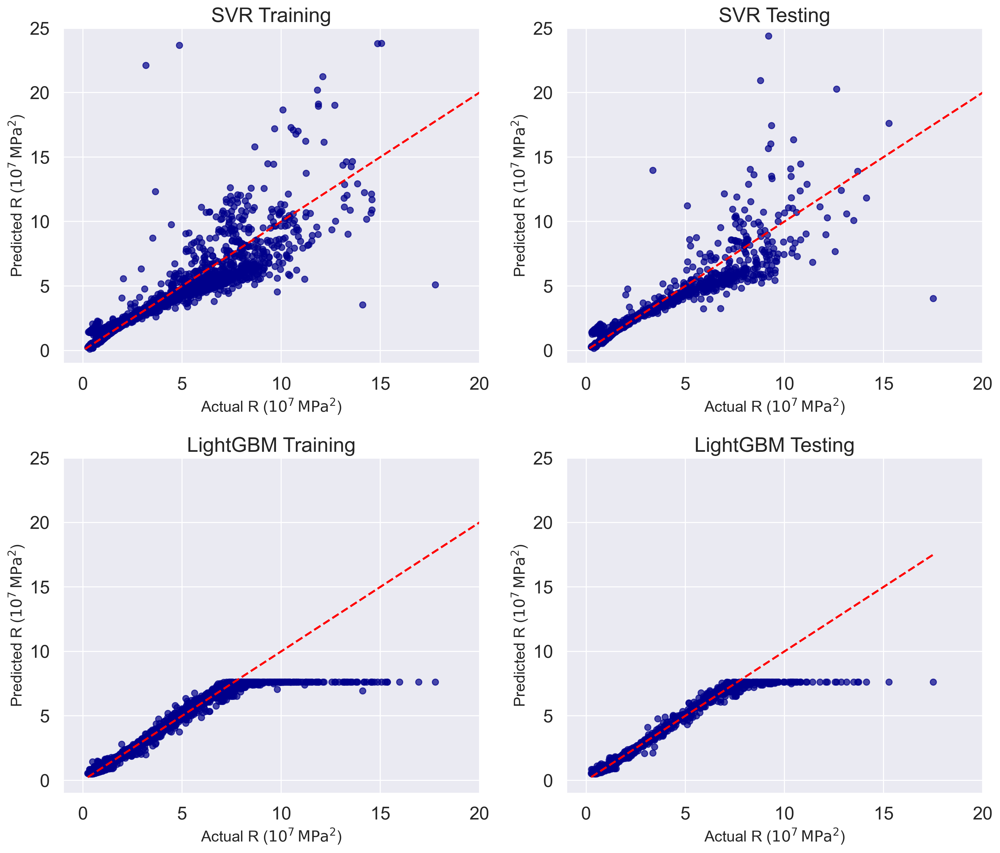

In [68]:
# Plotting the cross-plots of the actual and predicted values of the target (R) for the first case models
fig, axs = plt.subplots(2, 2, figsize=(14, 12), dpi=300)

# Plot 1: SVR Training
axs[0, 0].scatter(y_train_yt_original, y_train_pred_original, color='darkblue', alpha=0.7)
axs[0, 0].set_title('SVR Training', fontsize=20)
axs[0, 0].set_xlim(-1, 20)
axs[0, 0].set_ylim(-1, 25)
axs[0, 0].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[0, 0].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val = min(min(y_train_yt_original), min(y_train_pred_original))
max_val = max(max(y_train_yt_original), max(y_train_pred_original))
axs[0, 0].plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2) 
axs[0, 0].grid(True)

# Plot 2: SVR Testing
axs[0, 1].scatter(y_test_yt_original, y_test_pred_original, color='darkblue', alpha=0.7)
axs[0, 1].set_title('SVR Testing', fontsize=20)
axs[0, 1].set_xlim(-1, 20)
axs[0, 1].set_ylim(-1, 25)
axs[0, 1].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[0, 1].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_test = min(min(y_test_yt_original), min(y_test_pred_original))
max_val_test = max(max(y_test_yt_original), max(y_test_pred_original))
axs[0, 1].plot([min_val_test, max_val_test], [min_val_test, max_val_test],
               color='red', linestyle='--', linewidth=2)
axs[0, 1].grid(True)

# Plot 3: LightGBM Training
axs[1, 0].scatter(y_train_yt1_original, y_train_pred1_original, color='darkblue', alpha=0.7)
axs[1, 0].set_title('LightGBM Training', fontsize=20)
axs[1, 0].set_xlim(-1, 20)
axs[1, 0].set_ylim(-1, 25)
axs[1, 0].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[1, 0].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_train_lgbm = min(min(y_train_yt1_original), min(y_train_pred1_original))
max_val_train_lgbm = max(max(y_train_yt1_original), max(y_train_pred1_original))
axs[1, 0].plot([min_val_train_lgbm, max_val_train_lgbm], [min_val_train_lgbm, max_val_train_lgbm],
               color='red', linestyle='--', linewidth=2)
axs[1, 0].grid(True)

# Plot 4: LightGBM Testing
axs[1, 1].scatter(y_test_yt1_original, y_test_pred1_original, color='darkblue', alpha=0.7)
axs[1, 1].set_title('LightGBM Testing', fontsize=20)
axs[1, 1].set_xlim(-1, 20)
axs[1, 1].set_ylim(-1, 25)
axs[1, 1].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[1, 1].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_test_lgbm = min(min(y_test_yt1_original), min(y_test_pred1_original))
max_val_test_lgbm = max(max(y_test_yt1_original), max(y_test_pred1_original))
axs[1, 1].plot([min_val_test_lgbm, max_val_test_lgbm], [min_val_test_lgbm, max_val_test_lgbm], 
               color='red', linestyle='--', linewidth=2)
axs[1, 1].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

* For the training and testing sets of SVR, the scatter points aligns with the red dashed line, indicating a good fit. However, there's slightly more dispersion around the line compared to LightGBM, particularly for higher values of 𝑅2, and this suggests that while SVR performs well, it may struggle to perfectly capture extreme values or subtle nonlinearities in the data.

* For the training and testing sets of LightGBM, the points are tightly clustered around the diagonal line in both training and testing plots, reflecting its ability to capture the data pattern more precisely. There’s minimal dispersion, indicating that the model handles outliers and nonlinear relationships effectively.
Based on both the metrics and visual evaluation, LightGBM clearly outperforms SVR in this case, offering both better accuracy and generalization.

## (11) Building the Second Case Models
Here the same steps implemented previously for develpong the models would be followed, but this time the input features would be changed, and the best features according to the pearson's correlation matrix would be specified for modeling.

In [69]:
# Definig the inputs and output
features = ['UCS', 'E', 'φ','K','θ','μ', 'Pov', r'$\rho$'+'b'] 
target = ['R']

X = C_WELLA1[features]  # Features
Y = C_WELLA1[target]  

# Split the data into training and testing sets without shuffling
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle=True)

# Appling Yeo-Johnson transformation on the features 
PT_features = PowerTransformer(method='yeo-johnson')

# Fitting the transformation on the training data and transform both of the sets
X_train_yt = PT_features.fit_transform(X_train)
X_test_yt = PT_features.transform(X_test)

# Appling Yeo-Johnson transformation on the target
PT_target = PowerTransformer(method='yeo-johnson')

# Fitting the transformation on the training data and )
Y_train_yt = PT_target.fit_transform(Y_train)
Y_test_yt = PT_target.transform(Y_test)
                                
# Instantiate the MinMaxScaler
S_features = MinMaxScaler()

# Fitting the scaler on the training data and transform both of sets
X_train_scaled = S_features.fit_transform(X_train_yt)
X_test_scaled = S_features.transform(X_test_yt)

# Taking copies of the data
X_train_scaled1 = X_train_scaled.copy()
X_test_scaled1 = X_test_scaled.copy()
Y_train_yt1 = Y_train_yt.copy()
Y_test_yt1 = Y_test_yt.copy()

### Validation Curves of SVR's Hyperparameters

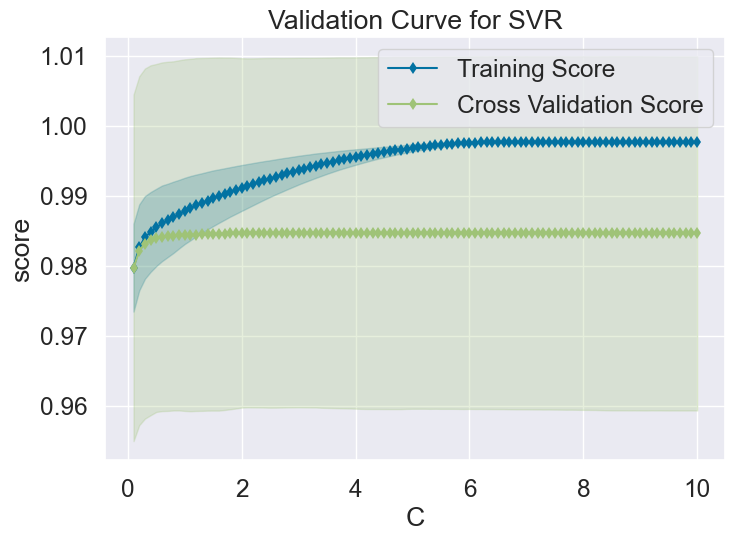

<AxesSubplot:title={'center':'Validation Curve for SVR'}, xlabel='C', ylabel='score'>

In [70]:
# Create a validation curve visualizer for C
visualization = ValidationCurve(
   SVR(), param_name="C", param_range=np.arange(0.1, 10+0.1, 0.1), cv=5, scoring="r2"
)

# Fit and visualize
visualization.fit(X_train_scaled, Y_train_yt)
visualization.show()

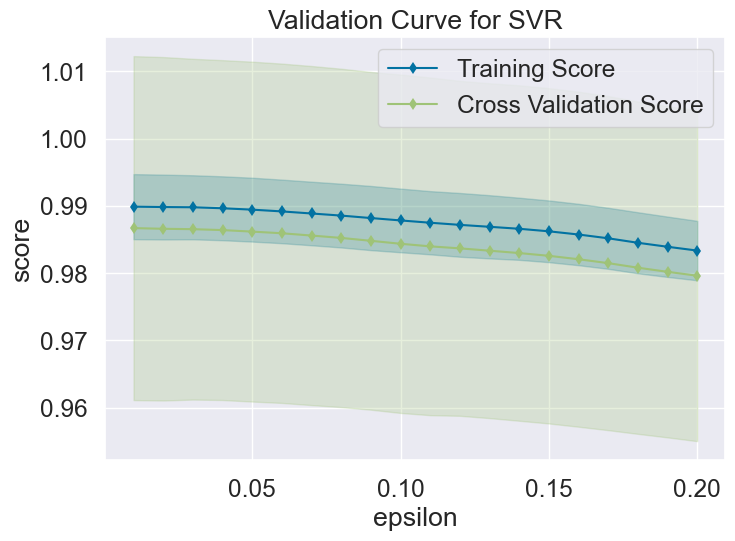

<AxesSubplot:title={'center':'Validation Curve for SVR'}, xlabel='epsilon', ylabel='score'>

In [71]:
# Create a validation curve visualizer for epsilon
visualization = ValidationCurve(
   SVR(), param_name="epsilon", param_range=np.arange(0.01, 0.2+0.01, 0.01), cv=5, scoring="r2"
)

# Fit and visualize
visualization.fit(X_train_scaled, Y_train_yt)
visualization.show()

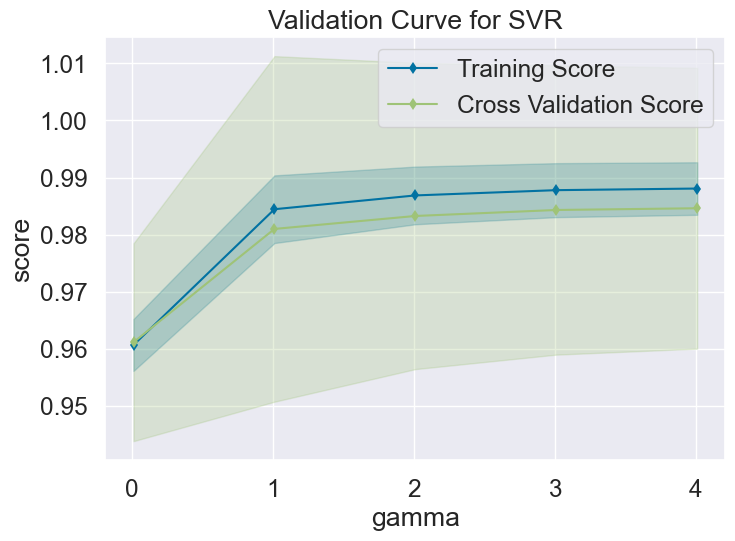

<AxesSubplot:title={'center':'Validation Curve for SVR'}, xlabel='gamma', ylabel='score'>

In [72]:
# Create a validation curve visualizer for gamma
visualization = ValidationCurve(
   SVR(), param_name="gamma", param_range=np.arange(0.01, 5), cv=5, scoring="r2"
)

# Fit and visualize
visualization.fit(X_train_scaled, Y_train_yt)
visualization.show()

### Validation Curves of LightGBM's Hyperparameters

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032132 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start trainin

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start trainin

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000350 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start trainin

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start trainin

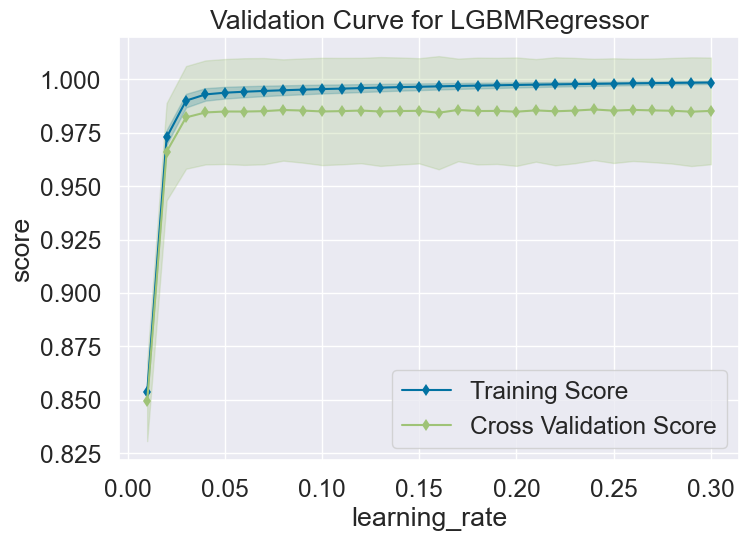

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='learning_rate', ylabel='score'>

In [73]:
# Creating a validation curve visualizer for learning rate
visualization = ValidationCurve(
   lgb.LGBMRegressor(), param_name="learning_rate", param_range=np.arange(0.0, 0.3+0.01, 0.01), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(X_train_scaled1, Y_train_yt1)
visualization.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000299 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000531 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

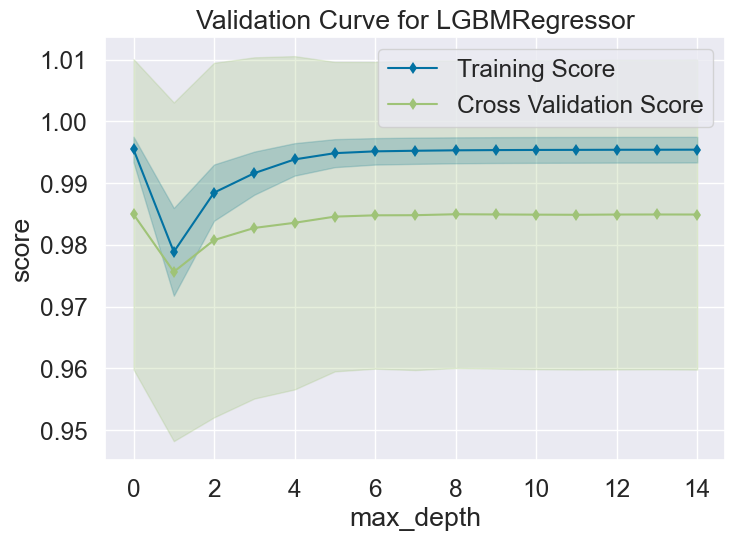

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='max_depth', ylabel='score'>

In [74]:
# Creating a validation curve visualizer for max depth
visualization = ValidationCurve(
    lgb.LGBMRegressor(), param_name="max_depth", param_range=np.arange(0, 15), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(X_train_scaled1, Y_train_yt1)
visualization.show()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start trainin

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start trainin

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000298 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start trainin

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000550 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start trainin

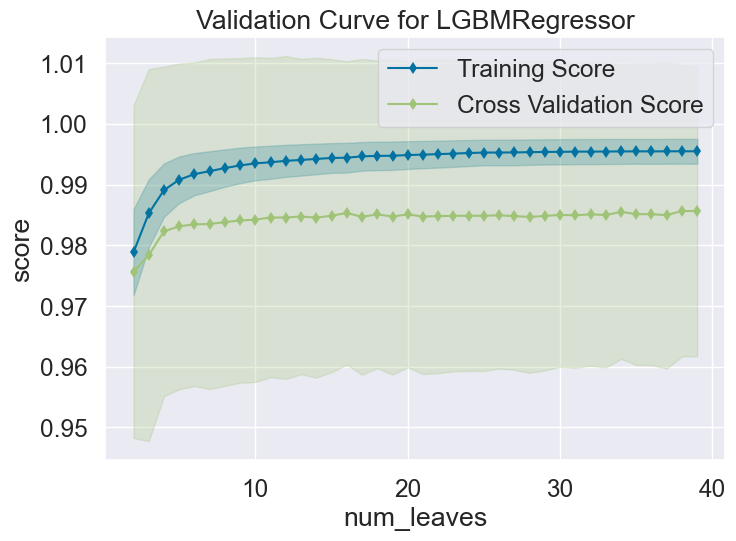

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='num_leaves', ylabel='score'>

In [75]:
# Creating a validation curve visualizer for num leaves
visualization = ValidationCurve(
    lgb.LGBMRegressor(), param_name="num_leaves", param_range=np.arange(0, 40), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(X_train_scaled1, Y_train_yt1)
visualization.show()

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] feature_fraction i

[LightGBM] [Warning] feature_fraction is set=1.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.1
[LightGBM] [Warning] feature_fraction is set=1.2000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.2000000000000002
[LightGBM] [Warning] feature_fraction is set=1.3000000000000003, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.3000000000000003
[LightGBM] [Warning] feature_fraction is set=1.4000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.4000000000000001
[LightGBM] [Warning] feature_fraction is set=1.5000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.5000000000000002
[LightGBM] [Warning] feature_fraction is set=1.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.6
[LightGBM] [Warning] feature_fraction is set=1.7000000000000002, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1

[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] feature_fraction i

[LightGBM] [Warning] feature_fraction is set=6.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.0
[LightGBM] [Warning] feature_fraction is set=6.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.1
[LightGBM] [Warning] feature_fraction is set=6.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.2
[LightGBM] [Warning] feature_fraction is set=6.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.3
[LightGBM] [Warning] feature_fraction is set=6.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.4
[LightGBM] [Warning] feature_fraction is set=6.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.5
[LightGBM] [Warning] feature_fraction is set=6.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.6
[LightGBM] [Warning] feature_fraction is set=6.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.7
[LightGB

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction is

[LightGBM] [Warning] feature_fraction is set=6.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.2
[LightGBM] [Warning] feature_fraction is set=6.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.3
[LightGBM] [Warning] feature_fraction is set=6.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.4
[LightGBM] [Warning] feature_fraction is set=6.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.5
[LightGBM] [Warning] feature_fraction is set=6.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.6
[LightGBM] [Warning] feature_fraction is set=6.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.7
[LightGBM] [Warning] feature_fraction is set=6.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.8
[LightGBM] [Warning] feature_fraction is set=6.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.9
[LightGB

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction is

[LightGBM] [Warning] feature_fraction is set=5.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.5
[LightGBM] [Warning] feature_fraction is set=5.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.6
[LightGBM] [Warning] feature_fraction is set=5.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.7
[LightGBM] [Warning] feature_fraction is set=5.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.8
[LightGBM] [Warning] feature_fraction is set=5.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.9
[LightGBM] [Warning] feature_fraction is set=6.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.0
[LightGBM] [Warning] feature_fraction is set=6.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.1
[LightGBM] [Warning] feature_fraction is set=6.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.2
[LightGB

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000533 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] feature_fraction i

[LightGBM] [Warning] feature_fraction is set=5.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.4
[LightGBM] [Warning] feature_fraction is set=5.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.5
[LightGBM] [Warning] feature_fraction is set=5.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.6
[LightGBM] [Warning] feature_fraction is set=5.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.7
[LightGBM] [Warning] feature_fraction is set=5.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.8
[LightGBM] [Warning] feature_fraction is set=5.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=5.9
[LightGBM] [Warning] feature_fraction is set=6.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.0
[LightGBM] [Warning] feature_fraction is set=6.1, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=6.1
[LightGB

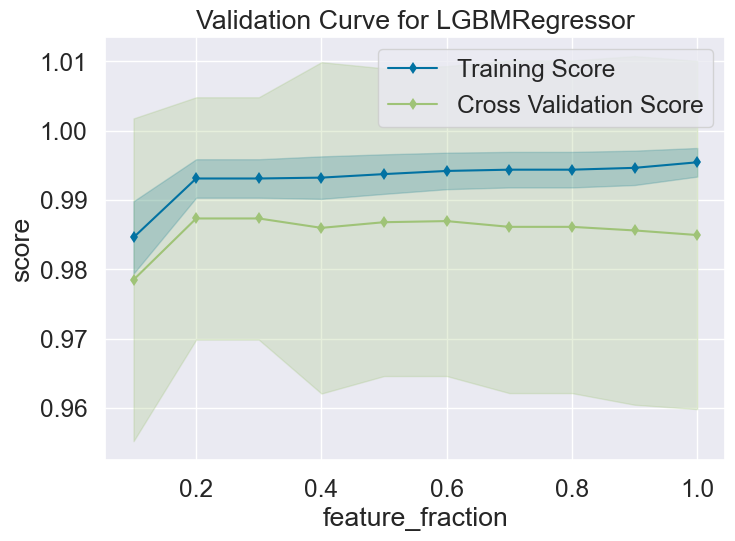

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='feature_fraction', ylabel='score'>

In [76]:
# Creating a validation curve visualizer for feature fraction
visualization = ValidationCurve(
    lgb.LGBMRegressor(), param_name="feature_fraction", param_range=np.arange(0.1, 10+0.1, 0.1), cv=5, scoring="r2"
)

# Fitting and visualizing
visualization.fit(X_train_scaled1, Y_train_yt1)
visualization.show()

[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000462 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Warning] lambda_l1 is set=43, reg_alpha=0.0 will be ignored. Current value: lambda_l1=43
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Warning] lambda_l1 is set=14, reg_alpha=0.0 will be ignored. Current value: lambda_l1=14
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Warning] lambda_l1 is set=21, reg_alpha=0.0 will be ignored. Current value: lambda_l1=21
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. C

[LightGBM] [Warning] lambda_l1 is set=26, reg_alpha=0.0 will be ignored. Current value: lambda_l1=26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Warning] lambda_l1 is set=39, reg_alpha=0.0 will be ignored. Current value: lambda_l1=39
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000469 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000500 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=31, reg_alpha=0.0 will be ignored. Current value: lambda_l1=31
[LightGBM] [Warning] lambda_l1 is set=31, reg_alpha=0.0 will be ignored. Current value: lambda_l1=31
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Warning] lambda_l1 is set=32, reg_alpha=0.0 will be ignored. Current value: lambda_l1=32
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] lambda_l1 is set=36, reg_alpha=0.0 will be ignored. Current value: lambda_l1=36
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Warning] lambda_l1 is set=37, reg_alpha=0.0 will be ignored. Current value: lambda_l1=37
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=42, reg_alpha=0.0 will be ignored. Current value: lambda_l1=42
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Warning] lambda_l1 is set=45, reg_alpha=0.0 will be ignored. Current value: lambda_l1=45
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] lambda_l1 is set=2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] lambda_l1 is set=12, reg_alpha=0.0 will be ignored. Current value: lambda_l1=12
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=19, reg_alpha=0.0 will be ignored. Current value: lambda_l1=19
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Warning] lambda_l1 is set=20, reg_alpha=0.0 will be ignored. Current value: lambda_l1=20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=24, reg_alpha=0.0 will be ignored. Current value: lambda_l1=24
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Warning] lambda_l1 is set=25, reg_alpha=0.0 will be ignored. Current value: lambda_l1=25
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=29, reg_alpha=0.0 will be ignored. Current value: lambda_l1=29
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Warning] lambda_l1 is set=30, reg_alpha=0.0 will be ignored. Current value: lambda_l1=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Warning] lambda_l1 is set=35, reg_alpha=0.0 will be ignored. Current value: lambda_l1=35
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Warning] lambda_l1 is set=38, reg_alpha=0.0 will be ignored. Current value: lambda_l1=38
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Warning] lambda_l1 is set=41, reg_alpha=0.0 will be ignored. Current value: lambda_l1=41
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] lambda_l1 is set=44, reg_alpha=0.0 will be ignored. Current value: lambda_l1=44
[LightGBM] [Warning] lambda_l1 is set=44, reg_alpha=0.0 will be ignored. Current value: lambda_l1=44
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[LightGBM] [Warning] lambda_l1 is set=46, reg_alpha=0.0 will be ignored. Current value: lambda_l1=46
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Warning] lambda_l1 is set=47, reg_alpha=0.0 will be ignored. Current value: lambda_l1=47
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] lambda_l1 is set=49, reg_alpha=0.0 will be ignored. Current value: lambda_l1=49
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] lambda_l1 is set=3, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3
[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Warning] lambda_l1 is set=4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Warning] lambda_l1 is set=6, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Warning] lambda_l1 is set=8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000558 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Warning] lambda_l1 is set=15, reg_alpha=0.0 will be ignored. Current value: lambda_l1=15
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000553 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] lambda_l1 is set=17, reg_alpha=0.0 will be ignored. Current value: lambda_l1=17
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Warning] lambda_l1 is set=18, reg_alpha=0.0 will be ignored. Current value: lambda_l1=18
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=22, reg_alpha=0.0 will be ignored. Current value: lambda_l1=22
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Warning] lambda_l1 is set=23, reg_alpha=0.0 will be ignored. Current value: lambda_l1=23
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=27, reg_alpha=0.0 will be ignored. Current value: lambda_l1=27
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Warning] lambda_l1 is set=28, reg_alpha=0.0 will be ignored. Current value: lambda_l1=28
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=33, reg_alpha=0.0 will be ignored. Current value: lambda_l1=33
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Warning] lambda_l1 is set=48, reg_alpha=0.0 will be ignored. Current value: lambda_l1=48
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

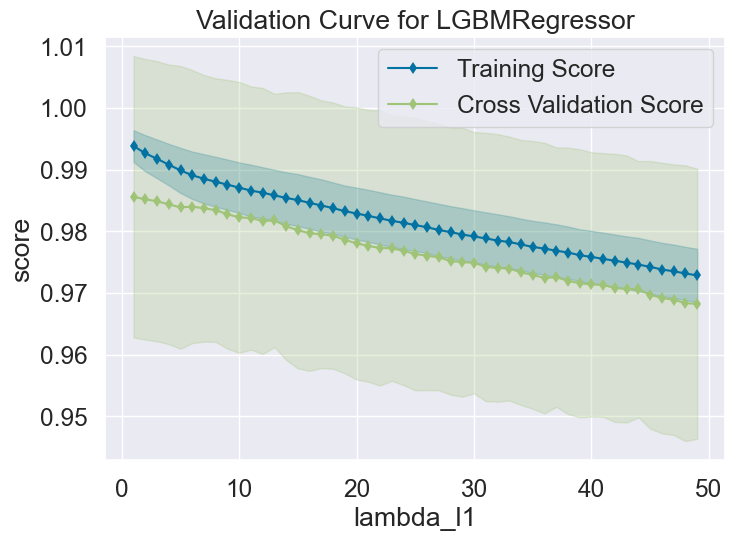

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='lambda_l1', ylabel='score'>

In [77]:
# Create the validation curve visualizer for lambda_l1
viz_l1 = ValidationCurve(
    lgb.LGBMRegressor(), param_name="lambda_l1", param_range=np.arange(1, 50), cv=5, scoring="r2", n_jobs=-1
)

# Fit and show the visualizer for lambda_l1
viz_l1.fit(X_train_scaled1, Y_train_yt1)
viz_l1.show()

[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Info] Auto-choosing col-wise multi-threading, t

[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=44, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44
[LightGBM] [Warning] lambda_l2 is set=44, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] lambda_l2 is set=47, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=50, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=61, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=64, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64
[LightGBM] [Warning] lambda_l2 is set=64, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lamb

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9

[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 wil

[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=22, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22
[LightGBM] [Warning] lambda_l2 is set=22, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000504 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overh

[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Warning] lambda_l2 is set=45, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000342 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning

[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[Ligh

[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Warning] lambda_l2 is set=99, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8
[LightGBM] [Warning] lambda_l2 is set=8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8
[LightGBM] [Warning] lambda_l2 is set=8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8
[LightGBM] [Warning] lambda_l2 is s

[LightGBM] [Warning] lambda_l2 is set=16, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16
[LightGBM] [Warning] lambda_l2 is set=16, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[LightGBM] [Warning] lambda_l2 is set=21, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21
[LightGBM] [Warning] lambda_l2 is set=21, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000501 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=30, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30
[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=34, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to r

[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Warning] lambda_l2 is set=38, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Warning] lambda_l2 is set=42, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Warning] lambda_l2 is set=67, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=90, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] lambda_l2 is set=93, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] lambda_l2 is set=96, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score 0.003609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] lambda_l2 is set=2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2
[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will

[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Warning] lamb

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=16, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16
[LightGBM] [Warning] lambda_l2 is set=16, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16
[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17
[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambd

[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] lambda_l2 is set=20, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20
[LightGBM] [Warning] lambda_l2 is set=21, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21
[LightGBM] [Warning] lambda_l2 is set=21, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Warning] lambda_l2 is set=24, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Warning] lambda_l2 is set=25, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to r

[LightGBM] [Warning] lambda_l2 is set=28, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28
[LightGBM] [Warning] lambda_l2 is set=28, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28
[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Warning] lambda_l2 is set=29, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Warning] lambda_l2 is set=33, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Warning] lambda_l2 is set=37, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

[LightGBM] [Warning] lambda_l2 is set=41, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000498 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] lambda_l2 is set=48, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Warning] lambda_l2 is set=49, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Warning] lambda_l2 is set=53, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=56, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Warning] lambda_l2 is set=57, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Warning] lambda_l2 is set=60, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Warning] lambda_l2 is set=63, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Warning] lambda_l2 is set=66, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Warning] lambda_l2 is set=70, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Warning] lambda_l2 is set=77, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] lambda_l2 is set=80, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=87, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored.

[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Warning] lambda_l2 is set=3, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4
[LightGBM] [Warning] lambda_l2 is set=4, reg_lambda=0.0 will be ignored. Current value: lambda_

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=11, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Warning] lambda_l2 is set=12, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Num

[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17
[LightGBM] [Warning] lambda_l2 is set=17, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Warning] lambda_l2 is set=18, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=22, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22
[LightGBM] [Warning] lambda_l2 is set=22, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22
[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Warning] lambda_l2 is set=23, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=26, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26
[LightGBM] [Warning] lambda_l2 is set=27, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27
[LightGBM] [Warning] lambda_l2 is set=27, reg_lambda=0.0 will be ignored. Current value: lambd

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Warning] lambda_l2 is set=31, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31
[LightGBM] [Warning] lambda_l2 is set=32, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32
[LightGBM] [Warning] lambda_l2 is set=32, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] lambda_l2 is set=35, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35
[LightGBM] [Warning] lambda_l2 is set=36, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36
[LightGBM] [Warning] lambda_l2 is set=36, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=39, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39
[LightGBM] [Warning] lambda_l2 is set=39, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Warning] lambda_l2 is set=40, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=44, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44
[LightGBM] [Warning] lambda_l2 is set=44, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] lambda_l2 is set=51, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Warning] lambda_l2 is set=52, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=54, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Warning] lambda_l2 is set=55, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=58, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59
[LightGBM] [Warning] lambda_l2 is set=59, reg_lambda=0.0 will be ignored. Current value: lambd

[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Warning] lambda_l2 is set=62, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

[LightGBM] [Warning] lambda_l2 is set=64, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64
[LightGBM] [Warning] lambda_l2 is set=64, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Warning] lambda_l2 is set=65, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[LightGBM] [Warning] lambda_l2 is set=68, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Warning] lambda_l2 is set=69, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=72, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Warning] lambda_l2 is set=73, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=75, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Warning] lambda_l2 is set=76, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=78, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Warning] lambda_l2 is set=79, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=81, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Warning] lambda_l2 is set=82, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=84, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Warning] lambda_l2 is set=85, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to r

[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=88, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=91, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Warning] lambda_l2 is set=92, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=94, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Warning] lambda_l2 is set=95, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=97, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Warning] lambda_l2 is set=98, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score -0.010165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

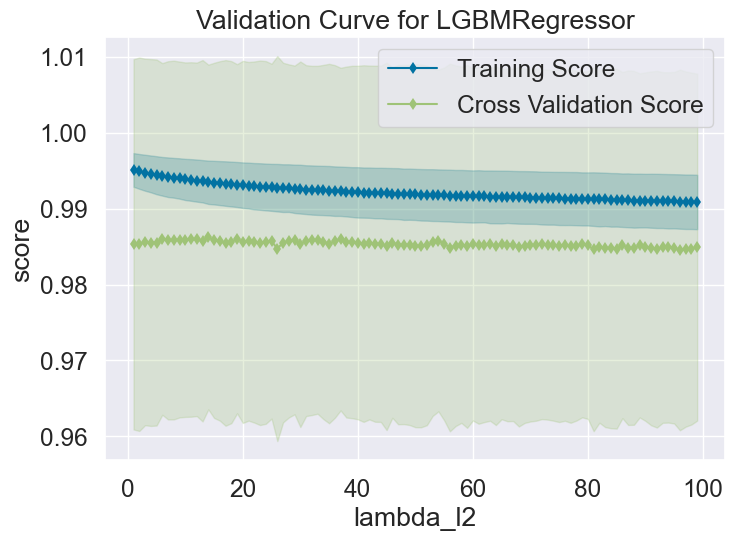

<AxesSubplot:title={'center':'Validation Curve for LGBMRegressor'}, xlabel='lambda_l2', ylabel='score'>

In [78]:
# Create the validation curve visualizer for lambda_l2
viz_l2 = ValidationCurve(
    lgb.LGBMRegressor(), param_name="lambda_l2", param_range=np.arange(1, 100), cv=5, scoring="r2", n_jobs=-1
)

# Fit and show the visualizer for lambda_l2
viz_l2.fit(X_train_scaled1, Y_train_yt1)
viz_l2.show()

### Building the Model with Training Set & Evaluate with Testing Set

In [79]:
# Define the model
SVR2 =  SVR()

# Define the parameter grid for Random Forest
param_grid = {
    'C':[0.1,0.2,0.3,4,6],
    'epsilon': [0.01,0.02,0.03,0.04,0.05],
    'gamma': [0.01,1,2],
    'kernel':['sigmoid','polynomial']
}

# Initialize HalvingGridSearchCV
halving_grid_search = HalvingGridSearchCV(
    estimator=SVR2,
    param_grid=param_grid,
    factor=2,  # Halving factor (default is 3)
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available cores
    verbose=2  # Display progress
)

# Fit the HalvingGridSearchCV to the training data
halving_grid_search.fit(X_train_scaled, Y_train_yt)

# Get the best hyperparameters and model
Best_model = halving_grid_search.best_estimator_
print(f"Best Hyperparameters: {halving_grid_search.best_params_}")

n_iterations: 8
n_required_iterations: 8
n_possible_iterations: 8
min_resources_: 32
max_resources_: 4113
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 150
n_resources: 32
Fitting 5 folds for each of 150 candidates, totalling 750 fits
----------
iter: 1
n_candidates: 75
n_resources: 64
Fitting 5 folds for each of 75 candidates, totalling 375 fits
----------
iter: 2
n_candidates: 38
n_resources: 128
Fitting 5 folds for each of 38 candidates, totalling 190 fits
----------
iter: 3
n_candidates: 19
n_resources: 256
Fitting 5 folds for each of 19 candidates, totalling 95 fits
----------
iter: 4
n_candidates: 10
n_resources: 512
Fitting 5 folds for each of 10 candidates, totalling 50 fits
----------
iter: 5
n_candidates: 5
n_resources: 1024
Fitting 5 folds for each of 5 candidates, totalling 25 fits
----------
iter: 6
n_candidates: 3
n_resources: 2048
Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------
iter: 7
n_candidates: 2
n_resources: 4096
Fi

In [80]:
# Number of features (p)
p = X_train_scaled.shape[1]

# Evaluating the model on training set  
Y_train_pred = Best_model.predict(X_train_scaled)
rr2_train = r2_score(Y_train_yt, Y_train_pred)
aadjusted_r2_train = adjusted_r2(rr2_train, len(Y_train_yt), p)
rrmse_train = mean_squared_error(Y_train_yt, Y_train_pred, squared=False)
mmae_train = mean_absolute_error(Y_train_yt, Y_train_pred)

print("Training Set Results:")
print(f"R²: {rr2_train:.4f}")
print(f"Adjusted R²: {aadjusted_r2_train:.4f}")
print(f"RMSE: {rrmse_train:.4f}")
print(f"MAE: {mmae_train:.4f}\n")

# Evaluating the model on test set
Y_test_pred = Best_model.predict(X_test_scaled)
rr2_test1 = r2_score(Y_test_yt, Y_test_pred)
aadjusted_r2_test = adjusted_r2(rr2_test1, len(Y_test_yt), p)
rrmse_test1 = mean_squared_error(Y_test_yt, Y_test_pred, squared=False)
mmae_test1 = mean_absolute_error(Y_test_yt, Y_test_pred)

print("Test Set Results:")
print(f"R²: {rr2_test1:.4f}")
print(f"Adjusted R²: {aadjusted_r2_test:.4f}")
print(f"RMSE: {rrmse_test1:.4f}")
print(f"MAE: {mmae_test1:.4f}")

Training Set Results:
R²: 0.9692
Adjusted R²: 0.9691
RMSE: 0.1756
MAE: 0.0784

Test Set Results:
R²: 0.9726
Adjusted R²: 0.9725
RMSE: 0.1658
MAE: 0.0811


In [81]:
# Define the model
LGBM2 =  lgb.LGBMRegressor()

# Define the parameter grid for Random Forest
param_grid = {
    'learning_rate':[0.05,0.08, 0.17, 0.24],
    'max_depth': [6,8],
    'feature_fraction': [0.3,0.5,0.6],
    'num_leaves': [16,20,39],
    'lambda_l1': [13,44,40],
    'lambda_l2': [54,89,100]
}

# Initialize HalvingGridSearchCV
halving_grid_search = HalvingGridSearchCV(
    estimator=LGBM2,
    param_grid=param_grid,
    factor=2,  # Halving factor (default is 3)
    cv=5,  # 5-fold cross-validation
    n_jobs=-1,  # Use all available cores
    verbose=2  # Display progress
)

# Fit the HalvingGridSearchCV to the training data
halving_grid_search.fit(X_train_scaled1, Y_train_yt1)

# Get the best hyperparameters and model
Best_model1 = halving_grid_search.best_estimator_
print(f"Best Hyperparameters: {halving_grid_search.best_params_}")

n_iterations: 9
n_required_iterations: 10
n_possible_iterations: 9
min_resources_: 10
max_resources_: 4113
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 648
n_resources: 10
Fitting 5 folds for each of 648 candidates, totalling 3240 fits
----------
iter: 1
n_candidates: 324
n_resources: 20
Fitting 5 folds for each of 324 candidates, totalling 1620 fits
----------
iter: 2
n_candidates: 162
n_resources: 40
Fitting 5 folds for each of 162 candidates, totalling 810 fits
----------
iter: 3
n_candidates: 81
n_resources: 80
Fitting 5 folds for each of 81 candidates, totalling 405 fits
----------
iter: 4
n_candidates: 41
n_resources: 160
Fitting 5 folds for each of 41 candidates, totalling 205 fits
----------
iter: 5
n_candidates: 21
n_resources: 320
Fitting 5 folds for each of 21 candidates, totalling 105 fits
----------
iter: 6
n_candidates: 11
n_resources: 640
Fitting 5 folds for each of 11 candidates, totalling 55 fits
----------
iter: 7
n_candidates: 6
n_resource

In [82]:
# Number of features (p)
p = X_train_scaled1.shape[1]

# Evaluate the model on training set
Y_train_pred1 = Best_model1.predict(X_train_scaled1)
RR2_train = r2_score(Y_train_yt1, Y_train_pred1)
AAdjusted_r2_train = adjusted_r2(RR2_train, len(Y_train_yt1), p)
RRmse_train = mean_squared_error(Y_train_yt1, Y_train_pred1, squared=False)
MMae_train = mean_absolute_error(Y_train_yt1, Y_train_pred1)

print("Training Set Results:")
print(f"R²: {RR2_train:.4f}")
print(f"Adjusted R²: {AAdjusted_r2_train:.4f}")
print(f"RMSE: {RRmse_train:.4f}")
print(f"MAE: {MMae_train:.4f}\n")

# Evaluate the model on test set
Y_test_pred1 = Best_model1.predict(X_test_scaled1)
RR2_test1 = r2_score(Y_test_yt1, Y_test_pred1)
AAdjusted_r2_test = adjusted_r2(RR2_test1, len(Y_test_yt1), p)
RRmse_test1 = mean_squared_error(Y_test_yt1, Y_test_pred1, squared=False)
MMae_test1 = mean_absolute_error(Y_test_yt1, Y_test_pred1)

print("Test Set Results:")
print(f"R²: {RR2_test1:.4f}")
print(f"Adjusted R²: {AAdjusted_r2_test:.4f}")
print(f"RMSE: {RRmse_test1:.4f}")
print(f"MAE: {MMae_test1:.4f}")

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
Training Set Results:
R²: 0.9830
Adjusted R²: 0.9829
RMSE: 0.1305
MAE: 0.0618

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
Test Set Results:
R²: 0.9883
Adjusted R²: 0.9883
RMSE: 0.1082
MAE: 0.0658


### Plotting Learning Curve of the Two Models

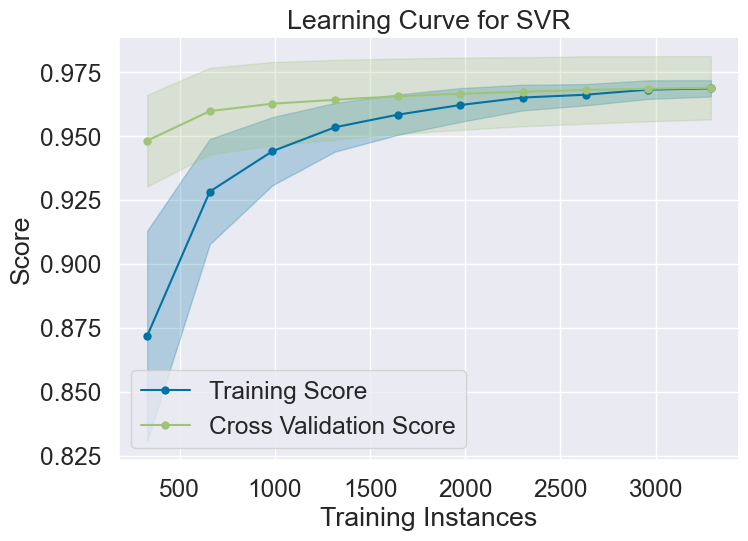

<AxesSubplot:title={'center':'Learning Curve for SVR'}, xlabel='Training Instances', ylabel='Score'>

In [83]:
# Instantiate the LearningCurve visualizer for SVR model
lc2 = LearningCurve(
    Best_model,
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # Evaluation metric
    train_sizes=np.linspace(0.1, 1.0, 10)  # Training set sizes
)

# Fitting the visualizer to the scaled and transformed training data
lc2.fit(X_train_scaled, Y_train_yt)
lc2.show()

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 880
[LightGBM] [Info] Number of data points in the train set: 329, number of used features: 8
[LightGBM] [Info] Start training from score 0.072492
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 880
[LightGBM] [Info] Number of data points in the train set: 329, number of used features: 8
[LightGBM] [Info] Start training from score 0.019821
[LightGB

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000476
[Ligh

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 1645, number of used features: 8
[LightGBM] [Info] Start training from score 0.002531
[Light

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] A

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 1645, number of used features: 8
[LightGBM] [Info] Start training from score 0.002531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 2961, number of used features: 8
[LightGBM] [Info] Start training from score -0.008088
[Ligh

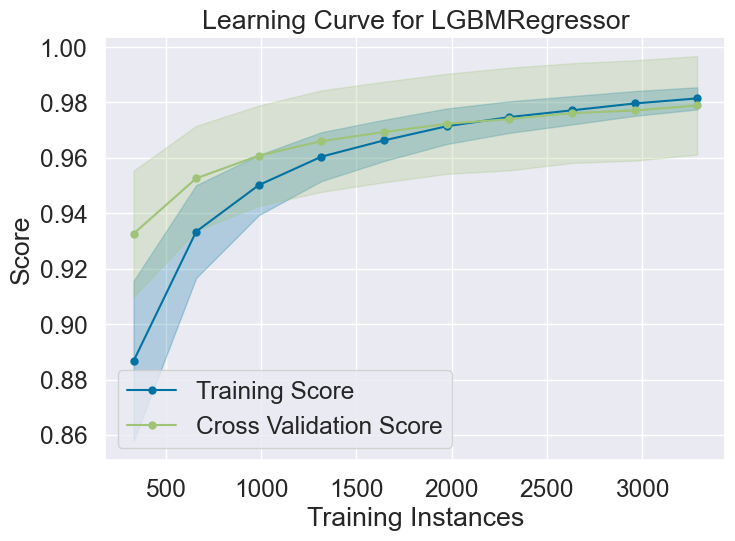

<AxesSubplot:title={'center':'Learning Curve for LGBMRegressor'}, xlabel='Training Instances', ylabel='Score'>

In [84]:
# Instantiate the LearningCurve visualizer for LighGBM model
LC2 = LearningCurve(
    Best_model1,
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # Evaluation metric
    train_sizes=np.linspace(0.1, 1.0, 10)  # Training set sizes
)

# Fitting the visualizer to the scaled and transformed training data
LC2.fit(X_train_scaled1, Y_train_yt1)
LC2.show()

As illustrated in the previous figures, both models showed excellent performance. On both figures, the training and cross-validation scores converge together as more data is added.

Training Score: The training curve increases with more data in the two models. In SVR it starts at a lower value and steadily increases as more data is added, which indicates that the algorithm learns effectively from the data and lastly converges at around 0.975 with larger training instances. In LightGBM, the training score starts lower as well and increases in a quick manner with the addition of more data and eventually stabilizes at around 0.98, which indicates it to be very effective in capturing patterns in the dataset.

Cross-Validation Score: for SVR it starts at a score higher than the training one, presenting initial underfitting that reduces with more data. For LightGBM, the cross-validation score improves steadily, converging with the training score at around 0.975. This convergence indicates good generalization with a slightly faster learning rate compared to SVR.

Bias-Variance Tradeoff: Both models show medium bias and low variance. LightGBM is preferred here for its faster learning rate and marginally better performance in terms of convergence and generalization. However, SVR is still strong, specifically if stability and consistent performance are required. Both models perform well in this case, but LightGBM has a slight edge due to its faster convergence and marginally higher final scores, so it's better than SVR.

### Comaprison of the Two Cases Models 
The two cases of the models were compared according to the learning curve, and the results are as follows:

* Training Scores For first case models (without mechanical properties): training scores were slightly lower, with SVR and LightGBM converging closer to 0.96 or 0.97. While for the second case, models (with mechanical properties): both models (SVR and LightGBM) show high training scores that converge close to 0.98.

* Cross-Validation Scores For the first case models, cross-validation scores are around 0.95-0.96, suggesting slightly less generalization than the second case models. While for the second case models, cross-validation scores converge near 0.975-0.98, showing improved generalization.

* Gap Between Training and Validation Scores The gap between training and validation scores in the second case models is minimal, indicating good model generalization. And for the first case models there's a slightly wider gap observed, especially for LightGBM.


The second case models are clearly better for the next reasons:
1. Higher final scores for both training and cross-validation.
2. Improved generalization, with minimal overfitting. 
3. Faster convergence, requiring fewer training instances to reach optimal performance.

### Plotting Cross-Validation Curve of the Two Models

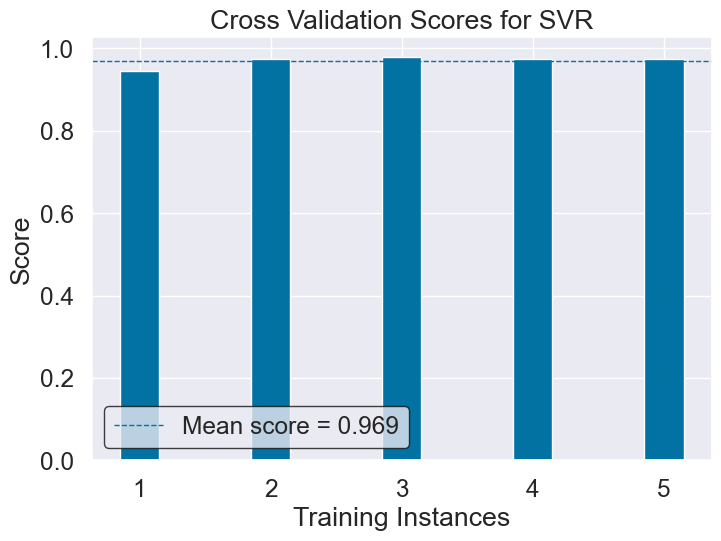

<AxesSubplot:title={'center':'Cross Validation Scores for SVR'}, xlabel='Training Instances', ylabel='Score'>

In [85]:
# Instantiate and fitting the CVScores visualizer for SVR model
visualizer = CVScores(Best_model, cv=5, scoring='r2')
visualizer.fit(X_train_scaled, Y_train_yt)
visualizer.show()

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3290, number of used features: 8
[LightGBM] [Info] Start training from score -0.000429
[Ligh

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2040
[LightGBM] [Info] Number of data points in the train set: 3291, number of used features: 8
[LightGBM] [Info] Start training from score 0.007461
[Light

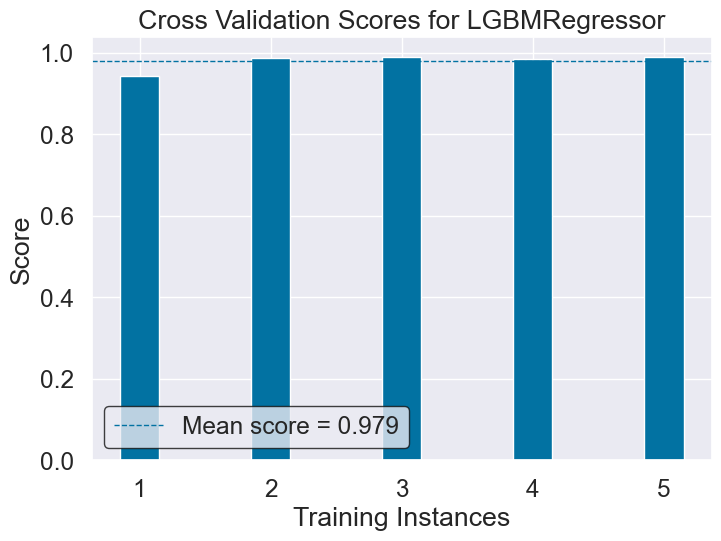

<AxesSubplot:title={'center':'Cross Validation Scores for LGBMRegressor'}, xlabel='Training Instances', ylabel='Score'>

In [86]:
# Instantiate and fitting the CVScores visualizer for LightGBM model
visualizer = CVScores(Best_model1, cv=5, scoring='r2')
visualizer.fit(X_train_scaled1, Y_train_yt1)
visualizer.show()

The mean score for cross-validation of SVR is 0.969, which is consistent with the R² of the training and test sets (almost the same), and for LighGBM is 0.978 which is consistent as well with the training and test sets, and that indicates a good performance of the two models, however, LightGBM model illustrates a better performance than SVR.

### Comparison of The Two Cases Models
The second case models demonstrate a better performance across nearly every fold according to the mean score (0.969 for SVR and 0.978 for LightGBM) compared to the first case models (0.906 for SVR and 0.956 for LightGBM).

### Denormalization of the Target Data Sets

In [87]:
# Step 1: Inverse Yeo Johnson Transformation of the target for SVR model
Y_train_yt_original, Y_train_pred_original = PT_target.inverse_transform(Y_train_yt.reshape(-1,1)), PT_target.inverse_transform(Y_train_pred.reshape(-1,1))
Y_test_yt_original, Y_test_pred_original = PT_target.inverse_transform(Y_test_yt.reshape(-1,1)), PT_target.inverse_transform(Y_test_pred.reshape(-1,1))

In [88]:
# Step 2: Inverse Yeo Johnson Transformation of the target for LighGBM model
Y_train_yt1_original, Y_train_pred1_original = PT_target.inverse_transform(Y_train_yt1.reshape(-1,1)), PT_target.inverse_transform(Y_train_pred1.reshape(-1,1))
Y_test_yt1_original, Y_test_pred1_original = PT_target.inverse_transform(Y_test_yt1.reshape(-1,1)), PT_target.inverse_transform(Y_test_pred1.reshape(-1,1))

### Plotting the Crossplots of the Actual Vs. the Predicted Target

In [89]:
# Divide each variable by 10^7

Y_train_yt_original /= 1e7
Y_train_pred_original /= 1e7
Y_test_yt_original /= 1e7
Y_test_pred_original /= 1e7
Y_train_yt1_original /= 1e7
Y_train_pred1_original /= 1e7
Y_test_yt1_original /= 1e7
Y_test_pred1_original /= 1e7

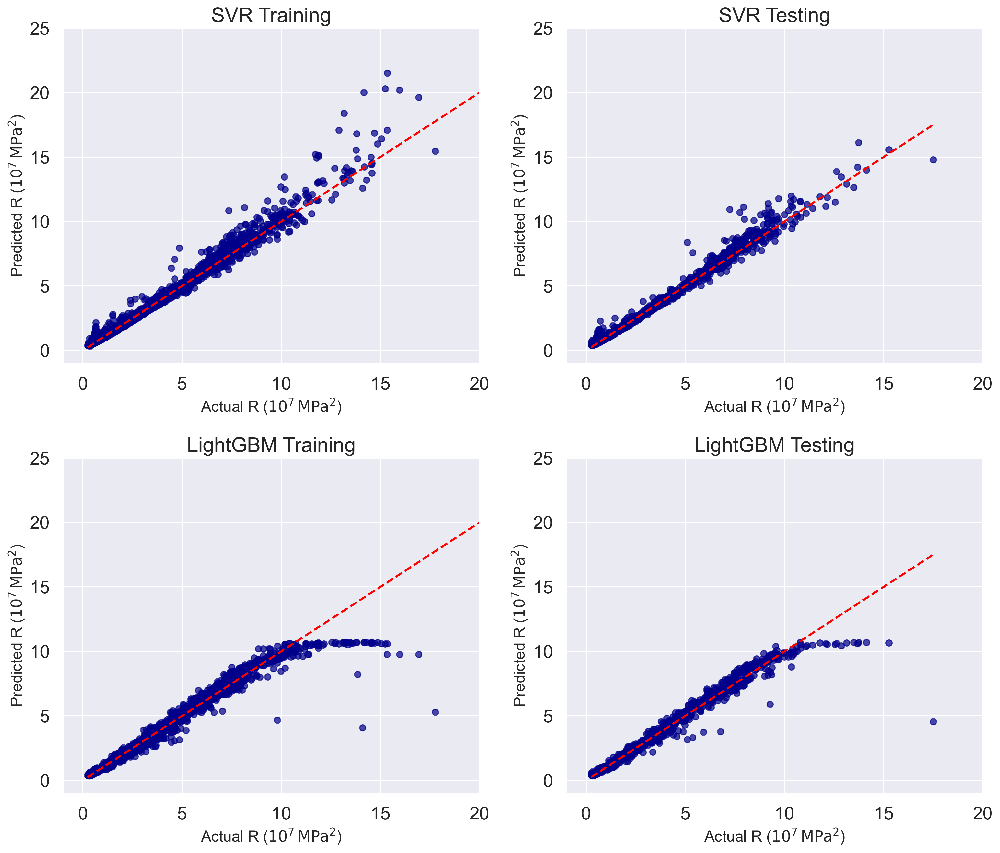

In [90]:
# Plotting the cross-plots of the actual and predicted values of the target (R) for the second case models
fig, axs = plt.subplots(2, 2, figsize=(14, 12), dpi=300)

# Plot 1: SVR Training
axs[0, 0].scatter(Y_train_yt_original, Y_train_pred_original, color='darkblue', alpha=0.7)
axs[0, 0].set_title('SVR Training', fontsize=20)
axs[0, 0].set_xlim(-1, 20)
axs[0, 0].set_ylim(-1, 25)
axs[0, 0].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[0, 0].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val = min(min(Y_train_yt_original), min(Y_train_pred_original))
max_val = max(max(Y_train_yt_original), max(Y_train_pred_original))
axs[0, 0].plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2)  # Red dashed line
axs[0, 0].grid(True)

# Plot 2: SVR Testing
axs[0, 1].scatter(Y_test_yt_original, Y_test_pred_original, color='darkblue', alpha=0.7)
axs[0, 1].set_title('SVR Testing', fontsize=20)
axs[0, 1].set_xlim(-1, 20)
axs[0, 1].set_ylim(-1, 25)
axs[0, 1].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[0, 1].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_test = min(min(Y_test_yt_original), min(Y_test_pred_original))
max_val_test = max(max(Y_test_yt_original), max(Y_test_pred_original))
axs[0, 1].plot([min_val_test, max_val_test], [min_val_test, max_val_test], color='red', linestyle='--', linewidth=2)
axs[0, 1].grid(True)

# Plot 3: LightGBM Training
axs[1, 0].scatter(Y_train_yt1_original, Y_train_pred1_original, color='darkblue', alpha=0.7)
axs[1, 0].set_title('LightGBM Training', fontsize=20)
axs[1, 0].set_xlim(-1, 20)
axs[1, 0].set_ylim(-1, 25)
axs[1, 0].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[1, 0].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_train_lgbm = min(min(Y_train_yt1_original), min(Y_train_pred1_original))
max_val_train_lgbm = max(max(Y_train_yt1_original), max(Y_train_pred1_original))
axs[1, 0].plot([min_val_train_lgbm, max_val_train_lgbm], [min_val_train_lgbm, max_val_train_lgbm], color='red', linestyle='--', linewidth=2)
axs[1, 0].grid(True)

# Plot 4: LightGBM Testing
axs[1, 1].scatter(Y_test_yt1_original, Y_test_pred1_original, color='darkblue', alpha=0.7)
axs[1, 1].set_title('LightGBM Testing', fontsize=20)
axs[1, 1].set_xlim(-1, 20)
axs[1, 1].set_ylim(-1, 25)
axs[1, 1].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[1, 1].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_test_lgbm = min(min(Y_test_yt1_original), min(Y_test_pred1_original))
max_val_test_lgbm = max(max(Y_test_yt1_original), max(Y_test_pred1_original))
axs[1, 1].plot([min_val_test_lgbm, max_val_test_lgbm], [min_val_test_lgbm, max_val_test_lgbm], color='red', linestyle='--', linewidth=2)
axs[1, 1].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

For the training and testing sets of SVR, the scatter points are tightly clustered around the red diagonal line, especially for lower values of 𝑅2, indicating a high level of accuracy during training. However, slight dispersion is observed at higher 𝑅2 values (>15), which indicates a potential for a slight bias in the model's generalization for extreme values.

For the training and testing sets of LightGBM, the scatter points predicted align very well with the actual values, illustrating a strong fit. The scatter points are more clustered than SVR; however, slight underfitting is noticeable at higher 𝑅2 values (>15), but less compared to SVR. Based on both the metrics and visual evaluation, LightGBM clearly outperforms SVR in this case, offering both better accuracy and generalization.

### Comparison of The Two Cases Models
Based on the cross-plots of the two cases, the second case models performed better than the first case models, with LightGBM showing tighter clustering and better generalization overall. SVR was competitive but showed more scatter at the extremes.
According to these plots the second case models performance is weaker for both models, with more pronounced underfitting and scatter. So, the second case of cross-plots demonstrates better performance for both models, with LightGBM being the superior model overall due to tighter alignment with the actual values and better generalization.

## (12) Deploy & Monitor Models 
At this step the two optimized models (SVR & LightGBM) would be put in work. They would be used to predict the sanding potential for a well in Fula oilfield then they would be compared with the actual sanding profile estimated from the emirical formula.

### Exploratory Data Analysis 

In [91]:
wellf = lasio.read("FNE-12_Final.las")

In [92]:
wellf.sections.keys()

dict_keys(['Version', 'Well', 'Curves', 'Parameter', 'Other'])

In [93]:
for item in wellf.sections['Well']:
    print(f"{item.descr} ({item.mnemonic}): \t\t {item.value}")

START DEPTH (STRT): 		 5.715
STOP DEPTH (STOP): 		 695.8584
STEP VALUE (STEP): 		 0.0762
NULL VALUE (NULL): 		 -999.0
Service Company/Logging company (SRVC): 		 SCH
LAS file Creation Date (DATE): 		 05/26/14
Well Name (WELL): 		 FNE-12
Company (COMP): 		 PETRO-ENERGY E&P CO.,LTD
Field (FLD): 		 FULA
Country (COUNT): 		 SUDAN
Location (LOC): 		 N
Latitude/Northing (LATI): 		 0
Longitude/Easting (LONG): 		 0
Permanent Datum (PDAT): 		 GL
Elevation of Permanent Datum (EPDAT): 		 543.913
Log Measured from (LGMEA): 		 KB
Drill Measured From (DRMEA): 		 KB
Elevation Above Permanent Datum (APDAT): 		 5.2
KB Elevation (KB): 		 549.113
DF Elevation (DF): 		 549.113
GL Elevation (GL): 		 543.913
Def_Rw (RWS): 		 0
Def_Rwt (WST): 		 0
Spud Date (DATS): 		 May 18, 2014
Completion Status (BHS): 		 Abandoned - Oil
Rig Name (RIGN): 		 DQEI-43


In [94]:
for count, curve in enumerate(wellf.curves):
    print(f"curve: {curve.mnemonic}, \t Units: {curve.unit}, \t Description: {curve.descr}")
print(f"there are total of: {count+1} curves present within this file")

curve: DEPTH, 	 Units: M, 	 Description: Depth
curve: BIT, 	 Units: IN, 	 Description: Bit size
curve: BVOL, 	 Units: M3, 	 Description: Total Borehole Volume
curve: CAL, 	 Units: IN, 	 Description: Caliper    Caliper
curve: CNC, 	 Units: dec, 	 Description: Neutron    Borehole size Corr-d Compensated Neutron Porosity
curve: CVOL, 	 Units: M3, 	 Description: Cement Volume
curve: DT, 	 Units: US/F, 	 Description: Sonic      Interval transit time over 24 inch interval
curve: GR, 	 Units: GAPI, 	 Description: GammaRay   Gamma Ray counts
curve: PE, 	 Units: B/E, 	 Description: PEF        Photo Electric Cross Section
curve: PERM, 	 Units: md, 	 Description: PEF        Mult-Line Formulae Output Curve
curve: PHIE, 	 Units: Dec, 	 Description: Phi
curve: RD, 	 Units: OHMM, 	 Description: DeepRes    Logarithmic Resistivity from ED, ID
curve: RMSL, 	 Units: OHMM, 	 Description: ShalRes    Resistivity from MSL
curve: RS, 	 Units: OHMM, 	 Description: ShalRes    Shallow resistivity
curve: SP, 	 Un

In [95]:
depth_curve = [curve for curve in wellf.curves if curve.mnemonic == "DEPTH"]

if depth_curve:
    depth_data = depth_curve[0].data  # Assuming 'data' holds the actual depth values
    print(depth_data)
else:
    print("Depth curve not found")

[  5.715    5.7912   5.8674 ... 695.706  695.7822 695.8584]


In [96]:
wellf['DEPTH'] = depth_data

In [97]:
WELLF = wellf.df()

In [98]:
# Check the index (depth) directly
print(WELLF.index)

# Reset index to turn depth into a column
WELLF.reset_index(inplace=True)
print(WELLF.head())

# Rename index to 'DEPTH' if necessary
WELLF.rename(columns={'index': 'DEPTH'}, inplace=True)

# Access it directly:
depth_data = WELLF.index
print(depth_data)

Float64Index([   5.715,   5.7912,   5.8674,   5.9436,   6.0198,    6.096,
                6.1722,   6.2484,   6.3246,   6.4008,
              ...
              695.1726, 695.2488,  695.325, 695.4012, 695.4774, 695.5536,
              695.6298,  695.706, 695.7822, 695.8584],
             dtype='float64', name='DEPTH', length=9058)
     DEPTH  BIT  BVOL  CAL  CNC  CVOL  DT  GR  PE  PERM  PHIE  RD  RMSL  RS  \
0 5.715000  NaN   NaN  NaN  NaN   NaN NaN NaN NaN   NaN   NaN NaN   NaN NaN   
1 5.791200  NaN   NaN  NaN  NaN   NaN NaN NaN NaN   NaN   NaN NaN   NaN NaN   
2 5.867400  NaN   NaN  NaN  NaN   NaN NaN NaN NaN   NaN   NaN NaN   NaN NaN   
3 5.943600  NaN   NaN  NaN  NaN   NaN NaN NaN NaN   NaN   NaN NaN   NaN NaN   
4 6.019800  NaN   NaN  NaN  NaN   NaN NaN NaN NaN   NaN   NaN NaN   NaN NaN   

   SP  SPD  SW  TTEN  VCLAV  ZCOR  ZDEN  
0 NaN  NaN NaN   NaN    NaN   NaN   NaN  
1 NaN  NaN NaN   NaN    NaN   NaN   NaN  
2 NaN  NaN NaN   NaN    NaN   NaN   NaN  
3 NaN  NaN NaN   NaN    N

In [99]:
# Columns to keep
columns_to_keep = ['DEPTH', 'DT', 'ZDEN','GR']

# Select specific columns and exclude others
WELLF_filtered = WELLF[columns_to_keep]

# Display the filtered DataFrame
print(WELLF_filtered)

          DEPTH  DT  ZDEN  GR
0      5.715000 NaN   NaN NaN
1      5.791200 NaN   NaN NaN
2      5.867400 NaN   NaN NaN
3      5.943600 NaN   NaN NaN
4      6.019800 NaN   NaN NaN
...         ...  ..   ...  ..
9053 695.553600 NaN   NaN NaN
9054 695.629800 NaN   NaN NaN
9055 695.706000 NaN   NaN NaN
9056 695.782200 NaN   NaN NaN
9057 695.858400 NaN   NaN NaN

[9058 rows x 4 columns]


In [100]:
print(WELLF_filtered.dtypes)

DEPTH    float64
DT       float64
ZDEN     float64
GR       float64
dtype: object


In [101]:
WELLF = WELLF_filtered.rename(columns = {'DT':'DTC', 'ZDEN': r'$\rho$'+'b'})

In [102]:
new_order = ['DEPTH','DTC', r'$\rho$'+'b', 'GR']
WELLF = WELLF[new_order]

In [103]:
WELLF.describe()

,DEPTH,DTC,$\rho$b,GR
count,9058.000000,8497.000000,8564.000000,8564.000000
mean,350.786700,142.612570,2.050009,74.298794
std,199.260234,26.446291,0.124566,22.286879
min,5.715000,55.708000,1.139000,23.982000
25%,178.250850,134.941000,1.995000,58.620000
50%,350.786700,143.404000,2.061000,75.430500
75%,523.322550,153.034000,2.118100,87.979500
max,695.858400,195.428000,2.594000,236.724000


### Data QC & Repair 

<AxesSubplot:>

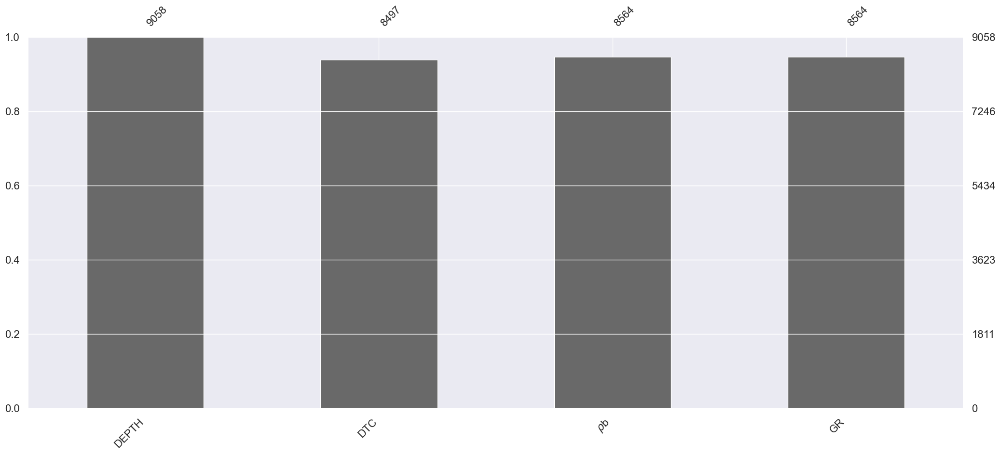

In [104]:
missno.bar(WELLF)

In [105]:
WELLF.isnull().sum()

DEPTH        0
DTC        561
$\rho$b    494
GR         494
dtype: int64

In [106]:
WELLF.dropna(inplace=True)

In [107]:
WELLF.isnull().sum()

DEPTH      0
DTC        0
$\rho$b    0
GR         0
dtype: int64

In [108]:
# Removing Outliers from WELLF
# Instantiating Isolation Forest to detect outliers
iso_forest = IsolationForest(random_state=42)  # 

# Fiting the Isolation Forest model to WELLB 
outliers = iso_forest.fit_predict(WELLF)

# The model returns 1 for normal points and -1 for outliers
# Filter out the rows marked as outliers
WELLF_no_outliers = WELLF[outliers == 1]

# Print the number of data points before and after removal
print(f"Number of data points before outlier removal: {WELLF.shape[0]}")
print(f"Number of data points after outlier removal: {WELLF_no_outliers.shape[0]}")

Number of data points before outlier removal: 8354
Number of data points after outlier removal: 6721


In [109]:
WELLF_no_outliers

,DEPTH,DTC,$\rho$b,GR
810,67.437000,183.504000,1.957000,67.454000
811,67.513200,185.893000,2.014000,69.853000
812,67.589400,187.344000,2.002000,71.691000
813,67.665600,188.157000,1.954000,71.061000
816,67.894200,188.352000,1.945000,55.878000
...,...,...,...,...
8670,666.369000,129.600000,2.133000,85.163000
8671,666.445200,129.468000,2.128000,84.348000
8672,666.521400,129.431000,2.115000,82.768000
8673,666.597600,129.312000,2.110000,80.296000


In [110]:
WELLF.describe()

,DEPTH,DTC,$\rho$b,GR
count,8354.000000,8354.000000,8354.000000,8354.000000
mean,348.424500,142.789563,2.050919,75.143709
std,183.774314,26.606775,0.121099,21.825150
min,30.175200,55.708000,1.139000,23.982000
25%,189.299850,135.269250,1.996000,59.650750
50%,348.424500,143.594000,2.062000,76.207000
75%,507.549150,153.282750,2.118100,88.419750
max,666.673800,195.428000,2.594000,236.724000


### Mechanical Properties Estimation 

In [111]:
WELLF_no_outliers.to_csv('cleaned_wellf.csv', index=False)

In [112]:
# Reading the file containing the necessary logging and mechanical properties data
C_WELLF = pd.read_csv('cleaned_wellf.csv')

In [113]:
C_WELLF.describe()

,DEPTH,DTC,DTS,GR,UCS,E,Porosity,K,Friction Angle,Poisson Ratio,R,Pov,$\rho$b
count,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000
mean,376.469201,146.147219,521.689956,75.943856,4.743654,2601.230222,0.510590,8008.991886,0.106831,0.396740,7707539.981046,6.153855,2.062300
std,159.585128,13.633850,211.588469,16.254405,1.181991,1165.362196,0.099498,1189.745541,0.036536,0.034551,4432755.552246,3.242904,0.077006
min,67.437000,113.905000,268.686232,36.069000,1.896449,174.448212,0.301003,4666.005432,0.012446,0.280905,273922.868700,0.000000,1.768000
25%,240.639600,137.282000,411.007378,63.149000,4.038347,1848.260799,0.443090,7341.173540,0.085954,0.374425,4635019.777000,3.380824,2.010000
50%,373.684800,144.234000,469.400807,77.414000,4.711780,2534.799126,0.493957,8066.196236,0.107597,0.395740,7062016.408000,6.035096,2.067400
75%,507.873000,151.843000,546.188899,87.540000,5.464459,3314.293063,0.555071,8831.790561,0.130318,0.416240,10141764.970000,8.839688,2.114000
max,666.673800,195.351000,1765.470770,135.810000,9.566644,7543.220946,0.910373,11629.148110,0.232097,0.487605,31511507.770000,12.123996,2.293000


In [114]:
# At this step the some columns will be renamed with a more known letters 
C_WELLF = C_WELLF.rename(columns = {'k':'K','𝜌b':r'$\rho$'+'b','Poisson Ratio':'μ','OV':'Pov','Friction Angle':'θ','Porosity':'φ'})

###  Final Prediction Using the Optimized Models.

In [116]:
print(C_WELLF.columns)

Index(['DEPTH', 'DTC', 'DTS', 'GR', 'UCS', 'E', 'φ', 'K ', 'θ', 'μ', 'R',
       'Pov ', '$\rho$b'],
      dtype='object')


In [117]:
C_WELLF.rename(columns={'K ':'K','$\rho$b':r'$\rho$'+'b','Pov ':'Pov'}, inplace=True)

In [118]:
# Define a function for Adjusted R²
def adjusted_r2(r2, n, k):
    """Calculate Adjusted R²."""
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# final Prediction of the target using Fula data
# Defining the inupts and targets of Volve data
Inputs = ['UCS', 'E', 'φ','K','θ','μ', 'Pov', r'$\rho$'+'b'] 
Output = ['R'] # This will be compared with the predicted one
X_FULA = C_WELLF[Inputs]  
Y_FULA = C_WELLF[Output]    

# Step 1: Applying the previously fitted Yeo-Johnson transformation on features
X_FULA_yt = PT_features.transform(X_FULA)  # Reuse the fitted PowerTransformer for features

# Step 2: Applying the previously fitted MinMaxScaler to the transformed features
X_FULA_scaled = S_features.transform(X_FULA_yt)  # Reuse the fitted MinMaxScaler of the training models

Y_FULA_yt = PT_target.transform(Y_FULA)

# Step 3: Using the trained model to predict sand production
Y_FULA_pred_SVR_yt = Best_model.predict(X_FULA_scaled) 
Y_FULA_pred_LGBM_yt = Best_model1.predict(X_FULA_scaled)

[LightGBM] [Warning] feature_fraction is set=0.3, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3
[LightGBM] [Warning] lambda_l1 is set=13, reg_alpha=0.0 will be ignored. Current value: lambda_l1=13
[LightGBM] [Warning] lambda_l2 is set=89, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89


In [119]:
Y_FULA_pred_SVR_yt

array([-2.68789268, -2.73689666, -2.79997112, ...,  0.04808005,
        0.04619908,  0.05415893])

In [120]:
Y_FULA_pred_LGBM_yt

array([-1.6661129 , -1.61866684, -1.6661129 , ...,  0.03341804,
        0.03341804,  0.08628789])

In [121]:
Y_FULA_yt

array([[-4.40128432],
       [-4.59186755],
       [-4.79689477],
       ...,
       [-0.18128168],
       [-0.18028266],
       [-0.16834676]])

### Evaluating the Performance of the Two Models 

In [122]:
# Evaluating the model on training set  
r2_svr = r2_score(Y_FULA_yt, Y_FULA_pred_SVR_yt)
adj_r2_svr = adjusted_r2(r2_svr, n=len(Y_FULA_yt), k=X_FULA_scaled.shape[1])
rmse_svr = mean_squared_error(Y_FULA_yt, Y_FULA_pred_SVR_yt, squared=False)
mae_svr = mean_absolute_error(Y_FULA_yt, Y_FULA_pred_SVR_yt)

# Print Metrics for SVR model
print("SVR Model Evaluation on Fula Data:")
print(f"R²: {r2_svr:.3f}")
print(f"Adjusted R²: {adj_r2_svr:.3f}")
print(f"RMSE: {rmse_svr:.3f}")
print(f"MAE: {mae_svr:.3f}\n")

SVR Model Evaluation on Volve Data:
R²: 0.694
Adjusted R²: 0.693
RMSE: 0.581
MAE: 0.421



In [123]:
# Evaluating LightGBM Model
r2_lgbm = r2_score(Y_FULA_yt, Y_FULA_pred_LGBM_yt)
adj_r2_lgbm = adjusted_r2(r2_lgbm, n=len(Y_FULA_yt), k=X_FULA_scaled.shape[1])
rmse_lgbm = np.sqrt(mean_squared_error(Y_FULA_yt, Y_FULA_pred_LGBM_yt))
mae_lgbm = mean_absolute_error(Y_FULA_yt, Y_FULA_pred_LGBM_yt)

# Print Metrics for LightGBM model
print("LightGBM Model Evaluation on Fula Data:")
print(f"R²: {r2_lgbm:.3f}")
print(f"Adjusted R²: {adj_r2_lgbm:.3f}")
print(f"RMSE: {rmse_lgbm:.3f}")
print(f"MAE: {mae_lgbm:.3f}\n")

LightGBM Model Evaluation on Volve Data:
R²: 0.534
Adjusted R²: 0.533
RMSE: 0.716
MAE: 0.369



### Denormalization Predicted Target 

In [124]:
# Inverse transformation of the predicted target to the original scale
Y_FULA_pred_SVR = PT_target.inverse_transform(Y_FULA_pred_SVR_yt.reshape(-1, 1))
Y_FULA_pred_LGBM = PT_target.inverse_transform(Y_FULA_pred_LGBM_yt.reshape(-1, 1))  
Y_FULA_A = PT_target.inverse_transform(Y_FULA_yt.reshape(-1, 1)) 

In [125]:
# Divide each variable by 10^7

Y_FULA_A /= 1e7
Y_FULA_pred_SVR /= 1e7
Y_FULA_pred_LGBM /= 1e7

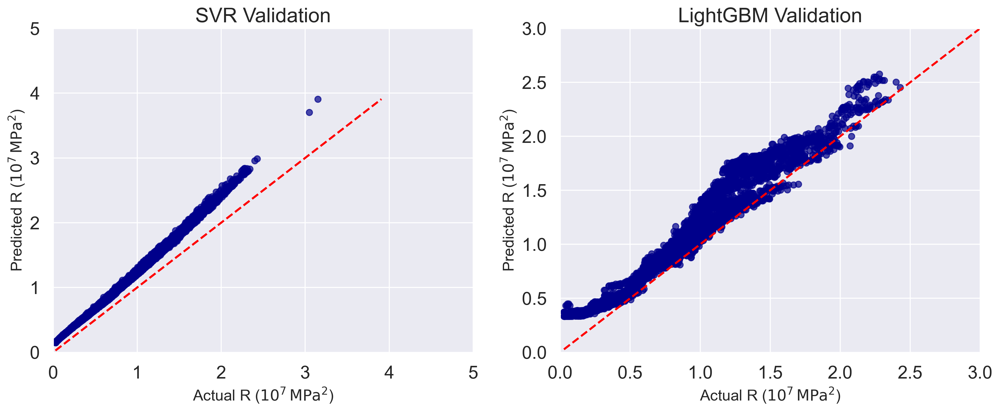

In [126]:
# Plotting the cross-plots of the actual and predicted values of the target (R) for the validation set models
fig, axs = plt.subplots(1, 2, figsize=(14, 6), dpi=300)

# Plot 1: SVR Validation
axs[0].scatter(Y_FULA_A, Y_FULA_pred_SVR, color='darkblue', alpha=0.7)
axs[0].set_title('SVR Validation', fontsize=20)
axs[0].set_xlim(0, 5)
axs[0].set_ylim(0, 5)
axs[0].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[0].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_val = min(min(Y_FULA_A), min(Y_FULA_pred_SVR))
max_val_val = max(max(Y_FULA_A), max(Y_FULA_pred_SVR))
axs[0].plot([min_val_val, max_val_val], [min_val_val, max_val_val], color='red', linestyle='--', linewidth=2)  # Red dashed line
axs[0].grid(True)

# Plot 2: LightGBM Validation
axs[1].scatter(Y_FULA_A, Y_FULA_pred_LGBM, color='darkblue', alpha=0.7)
axs[1].set_title('LightGBM Validation', fontsize=20)
axs[1].set_xlim(0, 3)
axs[1].set_ylim(0, 3)
axs[1].set_xlabel(r'Actual R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)
axs[1].set_ylabel(r'Predicted R ($10^7 \, \mathrm{MPa}^2$)', fontsize=15)

min_val_val_lgbm = min(min(Y_FULA_A), min(Y_FULA_pred_LGBM))
max_val_val_lgbm = max(max(Y_FULA_A), max(Y_FULA_pred_LGBM))
axs[1].plot([min_val_val_lgbm, max_val_val_lgbm], [min_val_val_lgbm, max_val_val_lgbm], color='red', linestyle='--', linewidth=2)
axs[1].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

In [127]:
# Adding the three columns to the data frame
if 'C_WELLF' not in locals():
    C_WELLF = pd.DataFrame()  

# Ensuring arrays are 1D
Y_FULA_A = Y_FULA_A.ravel() if len(Y_FULA_A.shape) > 1 else Y_FULA_A
Y_FULA_pred_SVR = Y_FULA_pred_SVR.ravel() if len(Y_FULA_pred_SVR.shape) > 1 else Y_FULA_pred_SVR
Y_FULA_pred_LGBM = Y_FULA_pred_LGBM.ravel() if len(Y_FULA_pred_LGBM.shape) > 1 else Y_FULA_pred_LGBM

# Ensure all arrays have the same length as the DataFrame before adding them
if len(Y_FULA_A) != len(C_WELLF) or len(Y_FULA_pred_SVR) != len(C_WELLF) or len(Y_FULA_pred_LGBM) != len(C_WELLF):
    raise ValueError("Array lengths must match the number of rows in the DataFrame!")

# Add columns to the existing DataFrame
C_WELLF['Y_actual'] = Y_FULA_A
C_WELLF['Y_pred_SVR'] = Y_FULA_pred_SVR
C_WELLF['Y_pred_LGBM'] = Y_FULA_pred_LGBM

# Display the first few rows of the updated DataFrame
print(C_WELLF.head())

      DEPTH        DTC         DTS        GR      UCS          E        φ  \
0 67.437000 183.504000 1174.647750 67.454000 2.287976 392.003808 0.772042   
1 67.513200 185.893000 1264.310263 69.853000 2.200893 348.572312 0.782042   
2 67.589400 187.344000 1324.454976 71.691000 2.150149 315.918643 0.787245   
3 67.665600 188.157000 1360.275884 71.061000 2.122398 292.407689 0.793952   
4 67.894200 188.352000 1369.109759 55.878000 2.115813 287.337714 0.829899   

            K        θ        μ             R      Pov  $\rho$b  Y_actual  \
0 5223.515702 0.025220 0.474985 688285.238400 0.000000 1.957000  0.068829   
1 5258.492617 0.022256 0.477904 615521.799900 0.001506 2.014000  0.061552   
2 5157.881038 0.020554 0.479583 546878.722400 0.003002 2.002000  0.054688   
3 4996.786825 0.019632 0.480494 490220.439600 0.004463 1.954000  0.049022   
4 4964.884001 0.019414 0.480709 478610.483400 0.008824 1.945000  0.047861   

   Y_pred_SVR  Y_pred_LGBM  
0    0.205472     0.432416  
1    0.198648   

In [128]:
C_WELLF.describe()

,DEPTH,DTC,DTS,GR,UCS,E,φ,K,θ,μ,R,Pov,$\rho$b,Y_actual,Y_pred_SVR,Y_pred_LGBM
count,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000,6721.000000
mean,376.469201,146.147219,521.689956,75.943856,4.743654,2601.230222,0.510590,8008.991886,0.106831,0.396740,7707539.981046,6.153855,2.062300,0.770754,0.989100,0.922724
std,159.585128,13.633850,211.588469,16.254405,1.181991,1165.362196,0.099498,1189.745541,0.036536,0.034551,4432755.552246,3.242904,0.077006,0.443276,0.508554,0.466333
min,67.437000,113.905000,268.686232,36.069000,1.896449,174.448212,0.301003,4666.005432,0.012446,0.280905,273922.868700,0.000000,1.768000,0.027392,0.150178,0.333572
25%,240.639600,137.282000,411.007378,63.149000,4.038347,1848.260799,0.443090,7341.173540,0.085954,0.374425,4635019.777000,3.380824,2.010000,0.463502,0.639342,0.529138
50%,373.684800,144.234000,469.400807,77.414000,4.711780,2534.799126,0.493957,8066.196236,0.107597,0.395740,7062016.408000,6.035096,2.067400,0.706202,0.903438,0.836348
75%,507.873000,151.843000,546.188899,87.540000,5.464459,3314.293063,0.555071,8831.790561,0.130318,0.416240,10141764.970000,8.839688,2.114000,1.014176,1.256242,1.179974
max,666.673800,195.351000,1765.470770,135.810000,9.566644,7543.220946,0.910373,11629.148110,0.232097,0.487605,31511507.770000,12.123996,2.293000,3.151151,3.907150,2.576594


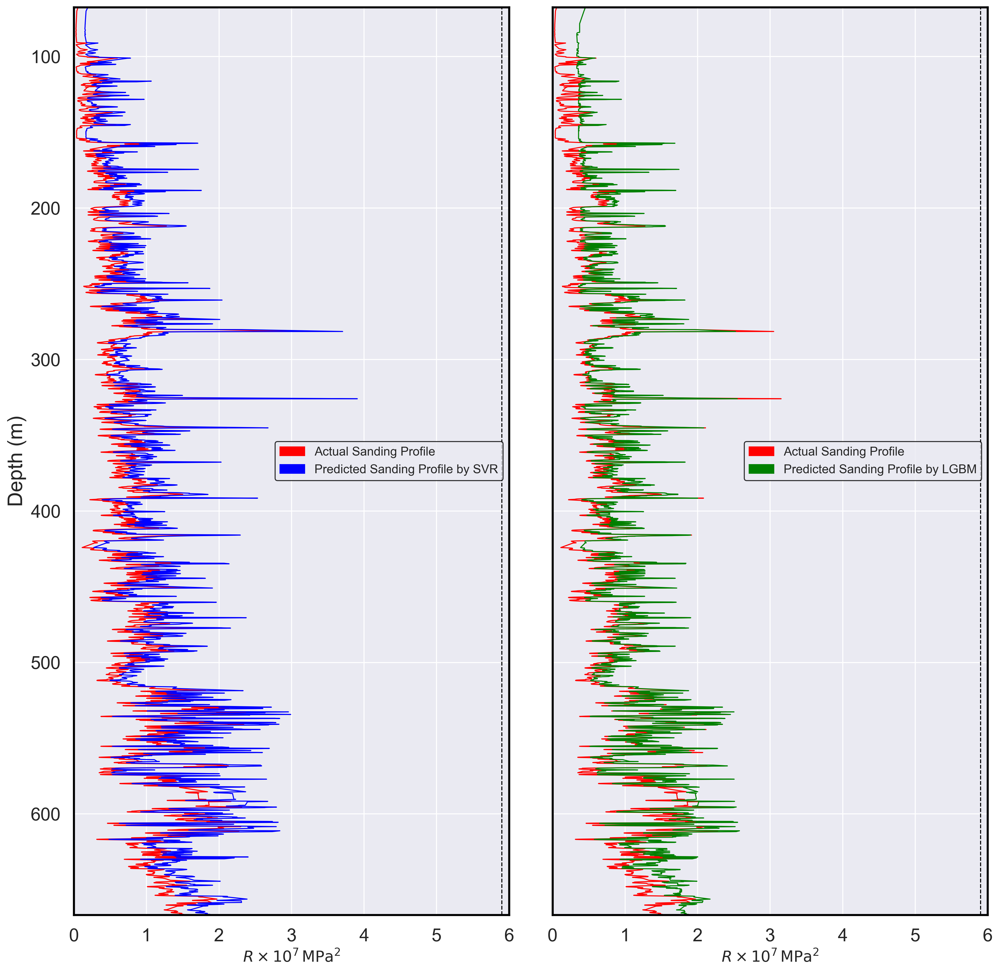

In [132]:
# Plotting the Actual Sanding Production Vs. Sanding profile predicted by SVR & LightGBM
fig, axes = plt.subplots(figsize=(16, 16), dpi=300)

# Getting the actual depth range from the dataset
min_depth, max_depth = C_WELLF["DEPTH"].min(), C_WELLF["DEPTH"].max()

# SVR subplot
ax1 = plt.subplot2grid((1, 2), (0, 0), rowspan=1, colspan=1)
ax1.plot("Y_actual", "DEPTH", data=C_WELLF, color="red", lw=1, label="Actual Sanding Profile")
ax1.plot("Y_pred_SVR", "DEPTH", data=C_WELLF, color="blue", lw=1, label="Predicted Sanding Profile by LGBM")
ax1.set_xlim(0, 6)
ax1.set_ylim(max_depth, min_depth)  # Reverse y-axis for depth
ax1.set_xlabel(r"$R \times 10^7 \, \mathrm{MPa}^2$", fontsize=15)
ax1.set_ylabel("Depth (m)", fontsize=20)
ax1.axvline(5.9, color="black", linestyle="--", linewidth=1)

# Set black borders for the plot
for spine in ax1.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(2)

# Add legend on the right side of the plot
legend_elements = [
    mpatches.Patch(color="red", label="Actual Sanding Profile"),
    mpatches.Patch(color="blue", label="Predicted Sanding Profile by SVR"),
]
ax1.legend(handles=legend_elements, loc="center right", fontsize=12, frameon=True, edgecolor="black")

# LightGBM subplot
ax2 = plt.subplot2grid((1, 2), (0, 1), rowspan=1, colspan=1)
ax2.plot("Y_actual", "DEPTH", data=C_WELLF, color="red", lw=1, label="Actual Sanding Profile")
ax2.plot("Y_pred_LGBM", "DEPTH", data=C_WELLF, color="green", lw=1, label="Predicted Sanding Profile by LGBM")
ax2.set_xlim(0, 6)
ax2.set_ylim(max_depth, min_depth)  # Reverse y-axis for depth
ax2.set_xlabel(r"$R \times 10^7 \, \mathrm{MPa}^2$", fontsize=15)
ax2.axvline(5.9, color="black", linestyle="--", linewidth=1)

# Set black borders for LightGBM
for spine in ax2.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(2)

# Add legend on the right side of the plot
legend_elements = [
    mpatches.Patch(color="red", label="Actual Sanding Profile"),
    mpatches.Patch(color="green", label="Predicted Sanding Profile by LGBM"),
]
ax2.legend(handles=legend_elements, loc="center right", fontsize=12, frameon=True, edgecolor="black")

# Remove y-tick labels on the second subplot for clarity
ax2.set_yticklabels([])

# Adjust layout and spacing
fig.subplots_adjust(wspace=0.1)
plt.show()

The evaluation metrics and data visualizations of the validation dataset support our hypothesis regarding the simplification and generalizability issues of the sanding prediction empirical formulas, where R2 and adjusted R2 are 0.69 and 0.53, and RMSE is 0.58 and 0.71 for SVR and LightGBM, respectively.

This huge gap in the evaluation metrics between the actual target estimated from the empirical formula and the predicted ones using machine learning algorithms suggests that these models do not follow the target blindly, and otherwise they create a complex pattern among these input features and account for mechanical properties that directly impact sand production, which results in a more reliable target than the empirical formula and overcomes the simplicity problem that empirical formulas suffer from. since these formulas are designed to work under specific assumptions and general conditions and often lack the flexibility to account for the complexities and variability of real-world data (e.g., heterogeneity of rock properties, operational conditions, etc.). They are developed using a limited dataset and may not generalize well to new formations or conditions outside their design range. 

Although the assessment visualizations (learning curves and cross-validation scores) show excellent generalizability of the algorithms, and the plot of the predicted vs. the actual values from both the empirical formula and the models suggests that the models are more reliable in practice, even in the regions with lower R2 values they still have the ability to better capture real trends. However, the comparison of these predictions (SVR and LightGBM predictions) with the actual field observation is required so that these models could be ready for industrial use.
